Due to rendering limitations in GitHub some plots in this notebook are not displayed when viewed on GitHub. To see a version of this notebook with all plots correctly rendered please visit this page:<br>
https://nbviewer.jupyter.org/github/moorebryan/CoFFee-Shop-Blues/blob/master/Feature_engineering_and_Analysis.ipynb

### import all packages
this is the main driver code that does the ML regression based predictions of the utility score.
Preliminary analysis such as clustering to monitor coffee shop trends,PCA,QQ plots to decide on the underlying distribution of our dataset are also shown here alongside some interesting trends in the data

In [1]:
from __future__ import print_function
import argparse
import geopandas as gpd
import json
import numpy as np
import math
from math import pi
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import os
import pandas as pd
import pprint
import pylab as pl
import requests
from scipy.cluster.hierarchy import linkage, dendrogram, set_link_color_palette
import seaborn as sns
from sklearn import preprocessing
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split
import shutil 
import sys
import urllib
import urllib.request 
import zipfile
try:
    # For Python 3.0 and later
    from urllib.error import HTTPError
    from urllib.parse import quote
    from urllib.parse import urlencode
except ImportError:
    # Fall back to Python 2's urllib2 and urllib
    from urllib2 import HTTPError
    from urllib import quote
    from urllib import urlencode
    
from pandas.io.json import json_normalize
from shapely.geometry import Point
from ast import literal_eval

## some old definitions for handling geopandas dataframes

In [2]:
#definitions
def lon_lat_str_to_tuple(string):
        
    '''
    because coords are converted from tuple to string when 
        '''
    string = string.split(', ')
    lon = float(string[0].split('(')[1])
    lat = float(string[1].split(')')[0])
    return (lon, lat)

In [3]:
def pd_to_gpd(df):
    '''
    Convert coffee df into geodataframe to allow for merge and analysis with neighborhood boundaries from Zillow.
    '''
    geom = df.apply(lambda x: Point(x['Location'][1], x['Location'][0]), axis=1)
    geo_df = gpd.GeoDataFrame(df, geometry=geom)
    geo_df.crs = {'init' :'epsg:4326'}
    return geo_df

In [4]:
def print_cities(cities):#maybe used later
    # print maps of all of the cities
    ncols = 2
    nrows = math.ceil(len(cities)/ncols)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize = (16, 100))
    for i in range(len(cities)):
        city_gdf = create_zillow_map(cities[i])
        ax = plt.subplot(nrows, ncols,i+1)
        city_gdf.plot(figsize=(8,8), color='lightblue', edgecolor='k', ax=ax)
        ax.set_title(cities[i], fontsize=14, weight='bold')
    return

#load all requisite pandas dataframes ,including population density and IRS income info for neighborhoods based on zipcode

In [5]:
#load primary csv and primary map 
from shapely.wkt import loads
path = 'coffee_data/COFFEE'
target_column_IRS=['zipcode','A02650']
df_city=pd.read_csv(path+'/{}_data.csv'.format('COFFEE'))
df_coffee_reviews=pd.read_csv(path+'/'+'coffee_reviews_cleaned.csv',usecols=['B_Id','rat_cat-NLTK_adjst'])
df_city_map=pd.read_csv(path+'/{}_map.csv'.format('COFFEE'))
gdf_city_map = gpd.GeoDataFrame(df_city_map)
gdf_city_map['geometry']=gdf_city_map['geometry'].apply(lambda x: loads(x))
gdf_city_map = gdf_city_map.set_geometry('geometry')

df_IRS=pd.read_csv('IRS_info.csv',usecols=target_column_IRS)
df_goog=pd.read_csv('search_counts.csv')
df_pop_density=pd.read_csv('ZCTA-Population-Density.csv')
#df_pop_density.head()
df_pop_density = df_pop_density.rename(columns={'Zip/ZCTA': 'Zip_Code'})
if set(['geom_mean_tt_shop_x','geom_mean_tt_shop_y']).issubset(df_city.columns):
    df_city.drop(columns=['geom_mean_tt_shop_x','geom_mean_tt_shop_y'],inplace=True)
    
df_city['geom_mean_tt_shop'].fillna(df_city['geom_mean_tt_shop'].median(), inplace=True)
temp=list(df_city['geom_mean_tt_shop'])
df_city=df_city.merge(df_coffee_reviews,how='outer',on='B_Id')

df_city.shape

(17380, 27)

## drop duplicate business ids and nan entries from store names

In [6]:
df_city.drop_duplicates(subset='B_Id',inplace=True)
df_city.dropna(subset =['Store_Name'],inplace=True)
df_city.shape

(17209, 27)

## generate word cloud. Will be used to construct domain based categories later

(-0.5, 1199.5, 599.5, -0.5)

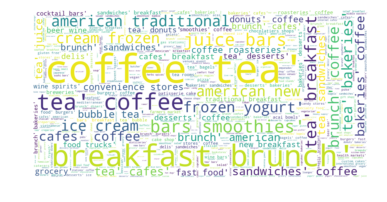

In [7]:
#key words in all categories
from wordcloud import WordCloud, STOPWORDS
all_coffee_words = ' '.join(df_city['Categories'].values.astype(str)).lower()
wc = WordCloud(background_color="white", max_words=2000, stopwords=set(STOPWORDS),
               width=1200, height=600, random_state=0)
wc.generate(all_coffee_words)
wc.to_file(path+'COFFEEWC.png')

plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

In [8]:
type(df_city.Price[0])

str

## add some more domain based categories such as tea_and_juice,chains,grab_and_go etc from popular store names across the nation

In [9]:
#Use key words to create engineered feature set
print(df_city.shape)
path = 'coffee_data/COFFEE'
chains =list(pd.DataFrame(df_city.Store_Name.value_counts()[df_city.Store_Name.value_counts()>=5]).index)
# bagels and donuts together??
donut_spellings = ['donut', 'Donut', 'Doughnut', 'doughnut', 'dough', 'Dough'] 
donut_stores = []
for spelling in donut_spellings:
    donut_stores.append(df_city[df_city['Store_Name'].str.contains(spelling,na=False)]['Store_Name'].unique())
donut_stores = [item for sublist in donut_stores for item in sublist]
temp = pd.DataFrame(donut_stores) 
donut_stores = temp[~temp[0].str.contains('Dunkin')][0].unique()#Dunkin is its own category

#feed in list of all possible known cofffee shop lists in different categories
corporate     = ['Starbucks', 'Peet\'s Coffee', 'Caffè Nero', 'Paris Baguette', 'The Coffee Bean & Tea Leaf', 'PJ\'s Coffee',
                 'Saxbys Coffee', 'illy Caffè', 'Peet\'s Coffee & Tea', 'Caffè Nero', 'Caribou Coffee', 'Dazbog Coffee',
                 'The Bean', 'Capital One Café', 'Coffee Bean & Tea Leaf', 'Starbucks Coffee', 'Dunn Brothers Coffee',
                 'Amille\'s Coffee', 'Minuti Coffee', 'Coffee Bean and Tea Leaf', 'The Coffee Bean and Tea Leaf', 'Starbucks - Terminal 8',
                 'Starbucks Reserve Roastery & Tasting Room', 'Starbucks Reserve Bar', 'Starbucks Reserve SODO','Starbucks Reserve', 
                 'Galpin Starbucks', 'Starbucks @ Runway', 'Starbucks Atrium', 'Starbucks SDSU', "Peet's Coffee and Tea",
                 'Peets Coffee & Tea', "Peet's - Cap One"]
tea_and_juice = ['Kung Fu Tea', 'JOE & THE JUICE', 'Argo Tea', 'It\'s Boba Time', 'CoCo Fresh Tea & Juice', 'DAVIDsTEA',
                 'BAMBU', 'Quickly', 'Chatime', 'Sharetea', 'The Teahouse Tapioca & Tea', 'Teapresso Bar', 'Project Juice', 'Tea Bar',
                 'Boba Guys', 'DavidsTea', 'Juice Press', 'Tapioca Express', 'Lollicup', 'Pressed Juicery', 'Moon Juice', 'The Chai Cart', 
                 'The Spice & Tea Exchange', 'Vital Tea Leaf', 'Taste Tea', 'Oasis Tea Zone', 'Fat Straws Bubble Tea', 'Hawa Smoothies & Bubble Tea',
                 'Gong Cha', 'Vivi Bubble Tea', 'Bon Bon Tea House', 'Cha Cha Matcha', 'Prince Tea House', 'Braganza Tea',
                 'Communitea', 'Sweetea', 'Infinitea', 'I Love Sweetea', 'Literatea', 'Sharetea', 'Infinitea Cafe 3', 'Golden Oolong Tea', 
                 'Tealicious Drinks', 'Tea + Victory', 'Tea Sip', 'Teabysea', 'Tea Top', 'The Teahouse Tapioca & Tea', 'Honey Bee Teahouse & Fast Food',
                 'T4 - Tea For U', 'Muse Tea', 'Greenway Coffee & Tea', "Jade's Tea House", 'Path Of Tea', 'JTea', 'Tea Do Contemporary Tea House',
                 '163 Vietnamese Sandwiches & Bubble Tea', 'Volcano Tea House', 'Tea Station', 'Tea Space','Tea Space Sunset Park', 
                 'Sheffield Spice & Tea Co', 'The Perfect Scoop & Boba Tea', 'OMG Boba Tea', 'Sencha Tea Bar - University of Minnesota',
                 'Kung Fu Tea - Dinkytown', 'Sencha Tea Bar - Uptown', 'Tea Master Matcha Cafe & Green Tea Shop',
                 'New High Ginseng Herbs & Tea Company', "Ten Ren's Tea Time", 'Wan Tea House', 'IntoTea',
                 'Hojas Tea House', "Tea Lover's Coffee and Juices", 'Venti Boba & Milk Corner', 'QQ Boba', 'Tea Story Boba Milk Tea', 
                 'Boba & Crepes', 'Boba Guys','Bobachine', 'I Heart Boba', 'Homeplate Boba', 'Panda Boba',"Te'amo Boba Bar", 'I Love Boba', 
                 'Boba Story', "It's Boba Time", 'Boba Loca', 'Boba Tea House', 'Boba My Tea', 'Bounce Boba Loft',
                 'Boba Loca Van Nuys', 'Mr Boba', 'Apples Boba & Bakery', 'Fresh T Boba & Smoothies', "Bee's Boba & Juicery", 'Boba Cha Cha',
                 'Boba Bear', 'Formosa Boba Men', 'House Of Boba',"Bee's Boba Express", 'Easy Life Boba Tea', 'Blitz Boba',
                 'Chewy Boba Company', 'Tea Drops Boba Supplies LV','The Perfect Scoop & Boba Tea', 'OMG Boba Tea',
                 'Boba Bar and Desserts', 'Venti Boba & Milk Corner', 'Boba Island', 'Bubbleology', 'The Bubble Tea Truck',
                 'Bubble U','Mr Green Bubble','Bubble Island', 'Snow Bubble Hut', 'Juice Bar NYC', 'Juicy Lucy Juice Bar', 'Juice Press',
                 'Grass Roots Juicery', 'Crocus Juice Bar and Cafe','Green Juice Cafe', 'Assembly Hall Juice & Coffee',
                 'Discovery Espresso & Juice', 'I Am The Juice Place','Project Juice', "Be Juice'd",'The Juice House', 
                 'LA Press Organic Cold Pressed Juice & Coffee','Kreation Organic Kafe & Juicery',
                 "Bee's Boba & Juicery", 'Pressed For Juice', 'Juice Joint Eatery',
                 'Choice Superfood Bar & Juicery', 'R3Fresh Juice Bar', 'Juice Wave', 'The Lights Juicery & Cafe']
grab_and_go   = ['Dunkin\' Donuts', 'McDonald\'s', 'Pret A Manger', 'Tim Hortons','Dunkin Donuts', 'Au Bon Pain', 
                 'Le Pain Quotidien', 'Cosi', 'Pret a Manger', 'Dutch Bros Coffee', 'Caffe Bene', 'Winchell\'s Donut House',
                 '85°C Bakery Cafe', 'Einstein Bros Bagels', '7-Eleven', 'Krispy Kreme', 'Dunkin\' Donuts / Baskin Robbins',
                 'Dunkin\' Donuts / Baskin-Robbins', 'Dunkin Donut', 'Tim Horton\'s', 'Dunkin Donuts Baskin Robbins',
                 'Einstein Bros', 'Dunkin’ Donuts', 'Crema Bodega', 'La Bodega', 'Mega Bodega', 'Grab & Go']
third_wave    = ['Blue Bottle Coffee', 'Gregorys Coffee', 'Bluestone Lane', 'Joe Coffee Company', 'Philz Coffee', 
                 'Top Pot Doughnuts', 'Matto Espresso', 'Cherry Street Coffee House', 'La Colombe Coffee', 'Stumptown Coffee Roasters',
                 'Intelligentsia Coffee', 'Think Coffee', 'Toby\'s Estate Coffee', 'Konditori', 'Gregory\'s Coffee', 'FIKA', 
                 'Compass Coffee', 'Cherry Street Coffee House', 'Caffe Ladro', 'Groundwork Coffee Co.', 'Birch Coffee', 'Crazy Mocha',
                 'Uptown Espresso', 'Oren\'s Daily Roast', 'Blue Star Donuts', 'Diva Espresso', 'Fuel', 'Crazy Mocha Coffee',
                 'Doughnut Plant', 'Pavement Coffeehouse', 'Ninth Street Espresso', 'Jack\'s Stir Brew Coffee', 'Stan\'s Donuts & Coffee',
                 'Honolulu Coffee', 'Coco Donuts', 'Joe Coffee', 'Brooklyn Roasting Company', 'Irving Farm New York', 'Hungry Ghost', 'Dolcezza',
                 'ink! Coffee Company', 'Black Rock Coffee Bar', 'La Colombe']
fancy_donuts  = donut_stores # also look for non-chain that include donuts! # note that may not add to 100% as some in 3rd wave too
questionable  = [ 'Tous Les Jours', 'Whole Foods Market',
                 'Van Leeuwen Artisan Ice Cream', 'Ebar', 'Maison Kayser', 'Kanela Breakfast Club', 'Chocolate Chair', 
                 'Nespresso Boutique at Bloomingdales', 'Sunny Street Cafe', 'Nespresso Boutique', 'Vitality Bowls', 'Snooze An AM Eatery',
                 'Martha\'s Country Bakery', 'Martha\'s Country Bakery', '"DeStefano\'s Steakhouse"', "General Tso\'s Chinese Restaurant",
                 'Al Naimat Restaurant & Sweets', 'Barbalu Restaurant', "Judy's Spanish Restaurant", 'Hanbat Restaurant', 'Parkway Restaurant',
                 'Perista Restaurant', 'Ravenna Varsity Restaurant', 'Sea Breeze Restaurant', 'Marla Bakery Restaurant',
                 'British Overseas Restaurant', 'Savanna Restaurant', 'Cal-Harbor Restaurant & Lounge','Merkato Ethiopian Restaurant & Market',
                 'Home Restaurant - Los Feliz', 'Botanica Restaurant & Market','Home Restaurant Silverlake','China King Restaurant In & Out', 
                 'Market Restaurant', 'Market Place Restaurant', 'Sampan Chinese Restaurant', 'Beijing Restaurant','Southwark Restaurant', 
                 'Keren Restaurant', "Curran's Family Restaurant", 'Rang Dong Restaurant', 'Red Sea Ethiopian Restaurant', '-321° Ice Cream Shop', 
                 'Blue Marble Ice Cream','Blossom Ice Cream', 'Sweet Alchemy Ice Creamery','Homefront Smoothies & Ice Cream', 
                 "Norman's Ice Cream & Freezes",'Cool Moon Ice Cream', 'Bobtail Ice Cream Company', 'Fragola Yogurt And Ice Cream',
                 'Bubbies Homemade Ice Cream and Desserts - Koko Marina Center', 'La La Homemade Ice Cream', 'Mariposa Ice Cream']
#create lists
#tea_and juice exclusively
tea = df_city[(df_city['Store_Name'].str.contains('Tea',na=False)) & (~df_city["Store_Name"].str.contains('Coffee',na=False))]['Store_Name'].unique()
tea_and_juice = list(set(list(tea_and_juice) + list(tea)))
# remove things that don't fall under our definition of a coffee shop
df_city['questionable']     = [store in questionable for store in df_city.Store_Name]
df_city = df_city[df_city['questionable'] == False]
df_city['corporate']     = [store in corporate for store in df_city.Store_Name]
df_city['tea_and_juice'] = [store in tea_and_juice for store in df_city.Store_Name]
df_city['grab_and_go']   = [store in grab_and_go for store in df_city.Store_Name]
df_city['fancy_donuts']  = [store in fancy_donuts for store in df_city.Store_Name] # donut stores not named 'Dunkin'
df_city['third_wave']    = [store in third_wave for store in df_city.Store_Name]
df_city['Price'] = [len(price) for price in df_city['Price']]
df_city['Count'] = 1

print(df_city.shape)
df_city.drop(columns='price_int',inplace=True)
high_review_threshold=8000#throw out store_name with abnormally high reviews.These are likely fake reviews/fake businesses
#mask=
df_city=df_city[~(df_city['Review_Count']>=high_review_threshold)]

df_city.columns

(17209, 27)
(17115, 34)


Index(['Store_Name', 'Categories', 'B_Id', 'Location', 'Zip_Code', 'Price',
       'Rating', 'Review_Count', 'geometry', 'State', 'County', 'City', 'Name',
       'RegionID', 'chain', 'strictly_coffee', 'coffee_is_cat',
       'breakfast_and_brunch', 'bakeries', 'diner', 'deli',
       'ice_cream_and_froyo', 'juice_and_smoothie', 'primary_category',
       'geom_mean_tt_shop', 'rat_cat-NLTK_adjst', 'questionable', 'corporate',
       'tea_and_juice', 'grab_and_go', 'fancy_donuts', 'third_wave', 'Count'],
      dtype='object')

## scrape census api for business density information by zipcode and groupby neighborhood.

In [10]:
#make attempt to query census patterns api 
API_KEY='73c8d3e7a4f92fce389870fee524efb953a918a8'
API_HOST = 'https://api.census.gov'
SEARCH_PATH = '/data/2016/zbp'
host=API_HOST
path=SEARCH_PATH
api_key=API_KEY
url = '{0}{1}'.format(host, quote(path.encode('utf8')))
zipcode=68505
params = {
    'get':['ESTAB','PAYANN'],'for':'zipcode'}

headers = {
    'Authorization': 'Bearer %s' % api_key,
}
response = requests.request('GET',url, headers=headers,params=params)
data=response.json()
columns=['no_of_establishments','Zip_Code']
temp1=[int(data[i][0]) for i in range(1,len(data))]
temp2=[int(data[i][1]) for i in range(1,len(data))]
data=[temp1,temp2]
df_census=pd.DataFrame(data = dict(zip(columns, data)))
#try merging with main workhorse df_city
zipcode_business_counts = dict(df_census.groupby('Zip_Code').mean()['no_of_establishments'])
df_city['tot_business_count_ZC'] = df_city.Zip_Code.map(zipcode_business_counts)\
                                        .fillna(0)\
                                        .astype(int)
#one last feature=annual income of the zipcode from IRS
zipcode_tot_income=dict(df_IRS.groupby('zipcode').mean()['A02650'])
df_city['Avg_Income_ZC']=df_city.Zip_Code.map(zipcode_tot_income)\
                                        .fillna(0)\
                                        .astype(float)\
                                        .round(3)
zipcode_pop_density = dict(df_pop_density.groupby('Zip_Code').mean().iloc[:,-1])
df_city['pop_density'] = df_city.Zip_Code.map(zipcode_pop_density)\
                                        .fillna(0)\
                                        .astype(float)\
                                        .round(2)
no_goog_hits=dict(df_goog.groupby('Store Name').mean().iloc[:,-1])
df_city['no_goog_hits']=df_city.Store_Name.map(no_goog_hits)\
                                         .fillna(0)\
                                         .astype(int)
print(df_city.shape)



(17108, 37)


## create final feature matrix grouped by neighborhood. 
Note: Utility score is the adjusted utility score from NLP analysis 

In [11]:
#create a utility score column for each coffee shop
#df_city.head()
#df_city['Utility_Score']=df_city.apply(lambda row: (row.Rating*row.Review_Count)/row.pop_density if row.pop_density!=0 else 0, axis=1)
df_city['Utility_Score']=df_city.apply(lambda row: (row.Rating*row.Review_Count), axis=1)

coffee_feature_matrix=df_city.copy()
coffee_feature_matrix.drop(columns=['Zip_Code','Store_Name','RegionID','B_Id'],axis=1,inplace=True)
coffee_feature_matrix = coffee_feature_matrix.fillna(coffee_feature_matrix.mode().iloc[0])
stdevs=coffee_feature_matrix.copy()



In [12]:
#
coffee_feature_matrix = coffee_feature_matrix.pivot_table(index=['State', 'County', 'City', 'Name'], aggfunc=('sum'))
coffee_feature_matrix.reset_index(inplace=True)
coffee_feature_matrix['loc_id'] = coffee_feature_matrix.Name + ', ' + coffee_feature_matrix.City
#coffee_feature_matrix.set_index('loc_id', drop=True, inplace=True)
#print(coffee_feature_matrix.shape)
stdevs = stdevs.pivot_table(index=['State', 'County', 'City', 'Name'],values=['Rating','Review_Count'],aggfunc=('std'))
stdevs.reset_index(inplace=True)
stdevs['loc_id'] = stdevs.Name + ', ' + stdevs.City
# stdevs.set_index('loc_id', drop=True, inplace=True)

stdevs = stdevs[['loc_id','Rating', 'Review_Count']]
stdevs.rename({'Rating': 'rating_stdev', 'Review_Count':'review_count_stdev'}, axis=1, inplace=True)
#print(stdevs.shape)
coffee_feature_matrix = coffee_feature_matrix.merge(stdevs,how='outer',on='loc_id')
coffee_feature_matrix.set_index('loc_id', drop=True, inplace=True)
#print(coffee_feature_matrix.columns)


gdf_city_map['loc_id'] = gdf_city_map.Name + ', ' + gdf_city_map.City
gdf_city_map['neighborhood_area'] = (gdf_city_map.geometry.area * 10000)  
neighborhood_areas = pd.DataFrame([gdf_city_map.loc_id, gdf_city_map.neighborhood_area]).T

coffee_feature_matrix = coffee_feature_matrix.merge(neighborhood_areas, left_index=True, right_on='loc_id',how='inner')
coffee_feature_matrix.drop(columns=['loc_id'], inplace=True)
#print(coffee_feature_matrix.shape)
df_new=pd.DataFrame()
df_new['loc_neighborhood']= coffee_feature_matrix.Name
df_new['loc_City']= coffee_feature_matrix.City 
df_new['coffee_shop_density'] = coffee_feature_matrix.Count / coffee_feature_matrix.neighborhood_area
df_new['business_density']=coffee_feature_matrix.tot_business_count_ZC / coffee_feature_matrix.neighborhood_area
df_new['mean_price'] = coffee_feature_matrix.Price / coffee_feature_matrix.Count
df_new['mean_rating'] = coffee_feature_matrix.Rating / coffee_feature_matrix.Count
df_new['mean_review_count'] = coffee_feature_matrix.Review_Count / coffee_feature_matrix.Count
df_new['mean_goog_search']=coffee_feature_matrix.no_goog_hits/coffee_feature_matrix.Count
df_new['Avg_income_neighborhood']=coffee_feature_matrix.Avg_Income_ZC/coffee_feature_matrix.Count
df_new['geom_mean_tt']=coffee_feature_matrix.geom_mean_tt_shop/coffee_feature_matrix.Count
df_new['rating_stdev'] = coffee_feature_matrix.rating_stdev
df_new['review_stdev'] = coffee_feature_matrix.review_count_stdev
df_new['pct_fancy_donuts']  = coffee_feature_matrix.fancy_donuts / coffee_feature_matrix.Count
df_new['pct_bakeries']      = coffee_feature_matrix.bakeries / coffee_feature_matrix.Count
df_new['pct_corporate']     = coffee_feature_matrix.corporate / coffee_feature_matrix.Count
df_new['pct_tea_and_juice'] = coffee_feature_matrix.tea_and_juice / coffee_feature_matrix.Count
df_new['pct_grab_and_go']   = coffee_feature_matrix.grab_and_go / coffee_feature_matrix.Count
df_new['pct_third_wave']    = coffee_feature_matrix.third_wave / coffee_feature_matrix.Count
chain_sum = coffee_feature_matrix.corporate + coffee_feature_matrix.tea_and_juice + coffee_feature_matrix.grab_and_go \
            + coffee_feature_matrix.third_wave # donughts left out, as not necessarily chain and can be double-counted
df_new['pct_independent']   = (coffee_feature_matrix.Count - chain_sum) / coffee_feature_matrix.Count
df_new['Avg_Utility_Score']=coffee_feature_matrix['rat_cat-NLTK_adjst'] / coffee_feature_matrix.Count
df_new['Count']=coffee_feature_matrix.Count





In [13]:
df_new.to_csv("full_feature_matrix.csv")

In [14]:

df_new.set_index('loc_neighborhood',inplace=True)
df_new.head()

,loc_City,coffee_shop_density,business_density,mean_price,mean_rating,mean_review_count,mean_goog_search,Avg_income_neighborhood,geom_mean_tt,rating_stdev,review_stdev,pct_fancy_donuts,pct_bakeries,pct_corporate,pct_tea_and_juice,pct_grab_and_go,pct_third_wave,pct_independent,Avg_Utility_Score,Count
loc_neighborhood,,,,,,,,,,,,,,,,,,,,
Acorn,Oakland,4.45295,6389.98,1.000000,3.250000,39.000000,1.500000,139153.333,975.06,1.767767,35.355339,0.5,0.0,0.0,0.0,0.5,0.0,0.5,92.316500,2
Acorn Industrial,Oakland,4.68175,6718.32,1.500000,4.750000,65.500000,5.500000,139153.333,975.06,0.353553,19.091883,0.0,0.0,0.0,0.0,0.0,0.0,1.0,356.741500,2
Adams Point,Oakland,12.7776,8854.88,1.555556,4.111111,295.555556,2.777778,369398.500,975.06,0.781736,326.330780,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1488.490667,9
Allendale,Oakland,2.98946,914.774,1.000000,4.250000,489.500000,0.000000,187212.833,975.06,0.353553,560.735677,0.5,0.0,0.0,0.0,0.0,0.0,1.0,2505.875000,2
Arrowhead Marsh,Oakland,0.489354,392.462,1.500000,2.750000,99.000000,2.000000,80363.000,975.06,1.060660,83.438600,0.0,0.0,0.5,0.0,0.0,0.0,0.5,220.400000,2


## quick check of no of null entries in each feature.Small percentage of null entries in rating stdev and review stdev,will be replaced with median val later

In [15]:
# Holds boolean whether entry is null or not
def nan_investigation(df):
    num_entries = df.shape[0]
    df_titles = list(df.columns.values)
    nan_count_df = pd.DataFrame(columns=df_titles,index=['Tot_Null','Tot_Not_Null','Perc_Null'])
    for column in df:
        nan_sum = df[column].isnull().sum()
        nan_count_df.set_value('Tot_Null', column, nan_sum)
        nan_count_df.set_value('Tot_Not_Null', column, num_entries-nan_sum)
        nan_count_df.set_value('Perc_Null', column, nan_sum/num_entries)

    display(nan_count_df)

In [16]:
nan_investigation(df_new)

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  if __name__ == '__main__':
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: FutureWarning: set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead
  # Remove the CWD from sys.path while we load stuff.


,loc_City,coffee_shop_density,business_density,mean_price,mean_rating,mean_review_count,mean_goog_search,Avg_income_neighborhood,geom_mean_tt,rating_stdev,review_stdev,pct_fancy_donuts,pct_bakeries,pct_corporate,pct_tea_and_juice,pct_grab_and_go,pct_third_wave,pct_independent,Avg_Utility_Score,Count
Tot_Null,0,0,0,0,0,0,0,0,0,459,459,0,0,0,0,0,0,0,0,0
Tot_Not_Null,1908,1908,1908,1908,1908,1908,1908,1908,1908,1449,1449,1908,1908,1908,1908,1908,1908,1908,1908,1908
Perc_Null,0,0,0,0,0,0,0,0,0,0.240566,0.240566,0,0,0,0,0,0,0,0,0


## histogram showing distribution of each feature 
most seem sufficiently Gaussian,we will check once more with a qq plot.Domain based features have large outliars

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a1c95e940>,
      dtype=object)

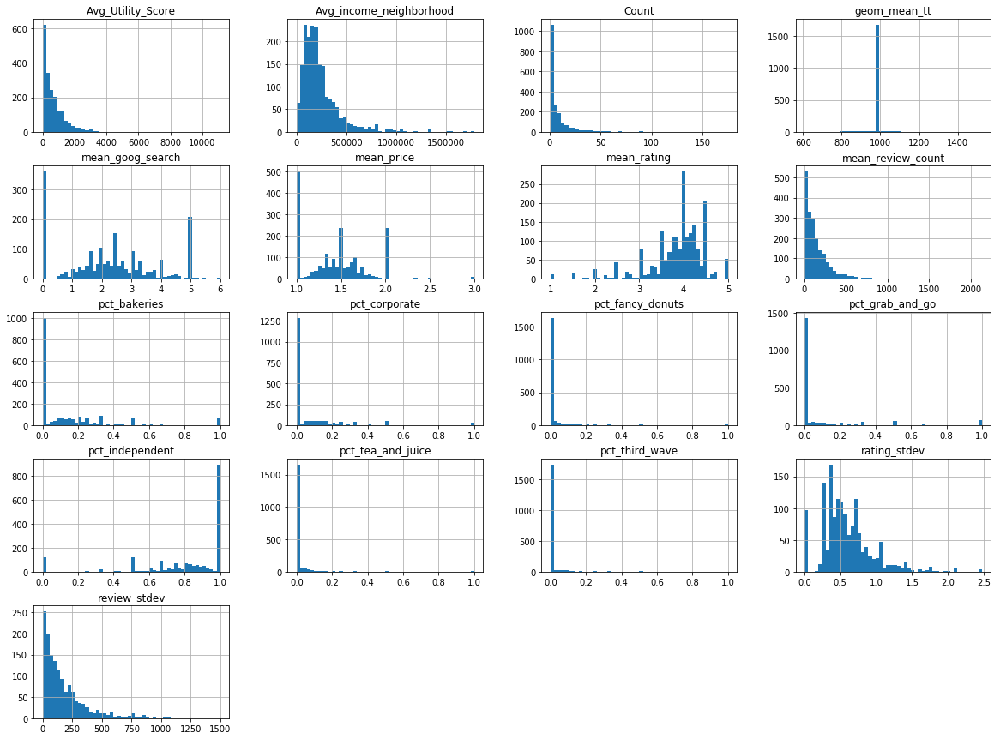

In [17]:
df_new.hist(bins=50, figsize=(20,15))

In [18]:
 #Now check correlations of all of these with the target 
#later drop features that were used to construct the target
df_new.corr()['Avg_Utility_Score'].abs().sort_values(ascending=False)

Avg_Utility_Score          1.000000
mean_review_count          0.994369
review_stdev               0.875596
Count                      0.266325
mean_rating                0.252520
Avg_income_neighborhood    0.249485
pct_grab_and_go            0.239059
rating_stdev               0.222558
mean_price                 0.221771
pct_independent            0.213350
geom_mean_tt               0.126498
pct_corporate              0.095621
pct_third_wave             0.071892
pct_tea_and_juice          0.054856
pct_bakeries               0.050308
pct_fancy_donuts           0.029808
mean_goog_search           0.015594
Name: Avg_Utility_Score, dtype: float64

In [19]:


df_pairplot=df_new.loc[:,~df_new.columns.isin(['loc_City'])]
df_pairplot.reset_index(drop=True,inplace=True)
df_pairplot.head()


,coffee_shop_density,business_density,mean_price,mean_rating,mean_review_count,mean_goog_search,Avg_income_neighborhood,geom_mean_tt,rating_stdev,review_stdev,pct_fancy_donuts,pct_bakeries,pct_corporate,pct_tea_and_juice,pct_grab_and_go,pct_third_wave,pct_independent,Avg_Utility_Score,Count
0,4.45295,6389.98,1.000000,3.250000,39.000000,1.500000,139153.333,975.06,1.767767,35.355339,0.5,0.0,0.0,0.0,0.5,0.0,0.5,92.316500,2
1,4.68175,6718.32,1.500000,4.750000,65.500000,5.500000,139153.333,975.06,0.353553,19.091883,0.0,0.0,0.0,0.0,0.0,0.0,1.0,356.741500,2
2,12.7776,8854.88,1.555556,4.111111,295.555556,2.777778,369398.500,975.06,0.781736,326.330780,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1488.490667,9
3,2.98946,914.774,1.000000,4.250000,489.500000,0.000000,187212.833,975.06,0.353553,560.735677,0.5,0.0,0.0,0.0,0.0,0.0,1.0,2505.875000,2
4,0.489354,392.462,1.500000,2.750000,99.000000,2.000000,80363.000,975.06,1.060660,83.438600,0.0,0.0,0.5,0.0,0.0,0.0,0.5,220.400000,2


## heat map to check covariance between features.Comment out if running full nb

In [20]:
# Matplotlib and seaborn for plotting
# import matplotlib.pyplot as plt
# %matplotlib inline

# import seaborn as sns
# from scipy import stats

# # Calculate correlation coefficient
# def corrfunc(x, y, **kws):
#     r, _ = stats.pearsonr(x, y)
#     ax = plt.gca()
#     ax.annotate("r = {:.2f}".format(r),
#                 xy=(.1, .6), xycoords=ax.transAxes,
#                size = 24)
    
# cmap = sns.cubehelix_palette(light=1, dark = 0.1,
#                              hue = 0.5, as_cmap=True)

# sns.set_context(font_scale=5)

# # Pair grid set up
# g = sns.PairGrid(df_pairplot)

# # Scatter plot on the upper triangle
# g.map_upper(plt.scatter, s=10, color = 'red')

# # Distribution on the diagonal
# #g.map_diag(sns.distplot, kde=False, color = 'red')

# # Density Plot and Correlation coefficients on the lower triangle
# g.map_lower(sns.kdeplot, cmap = cmap)
# g.map_lower(corrfunc);

In [21]:
#g.savefig('plots/covariance.png')

## correlation heat map between features

[]

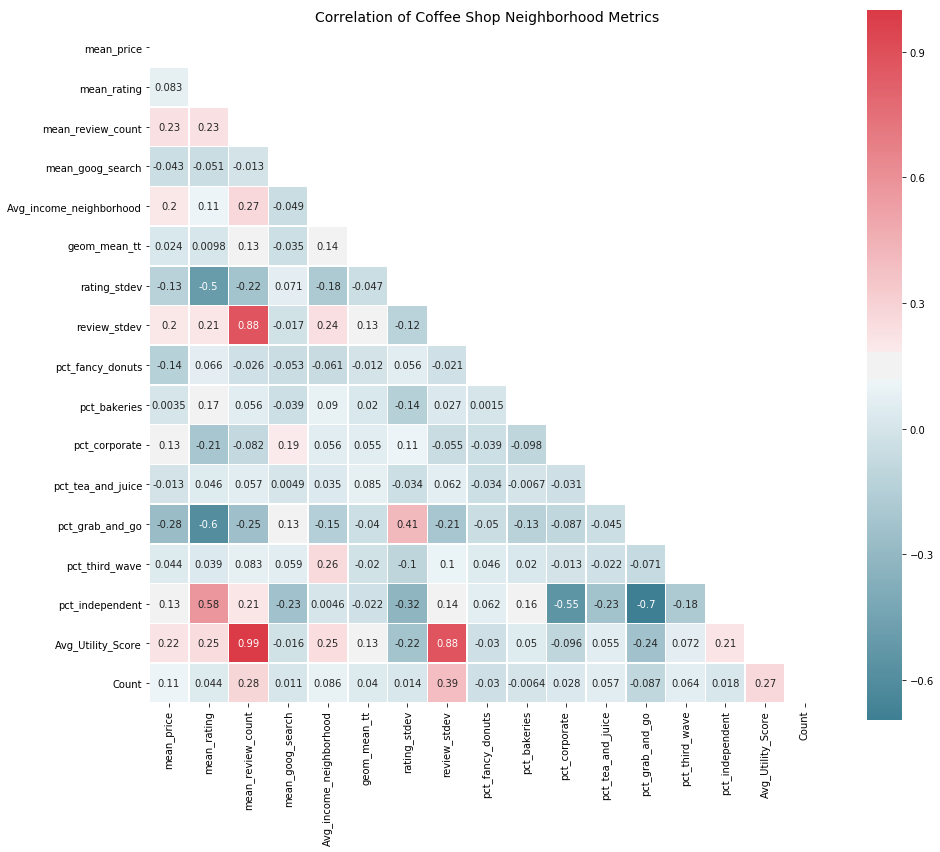

In [22]:

neigh_corr = df_new.corr()
fig = plt.figure(figsize=(14,12))
mask = np.zeros_like(neigh_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(neigh_corr, cmap=cmap, linewidths=0.5, annot=True, square=True, mask=mask)
plt.title('Correlation of Coffee Shop Neighborhood Metrics', size=14)
plt.tight_layout()
plt.savefig('plots/corr.png')
plt.plot()                

In [23]:
import colorsys
import yaml

import pandas as pd
from bokeh.io import output_file, show
from bokeh.models import BasicTicker, ColorBar, LinearColorMapper, ColumnDataSource, PrintfTickFormatter,HoverTool
from bokeh.plotting import figure
from bokeh.transform import transform
from bokeh.palettes import Viridis3, Viridis256
# Read your data in pandas dataframe

#Now we will create correlation matrix using pandas
df = df_new.corr()

df.index.name = 'AllColumns1'
df.columns.name = 'AllColumns2'

# Prepare data.frame in the right format
df = df.stack().rename("value").reset_index()

# here the plot :
output_file("CorrelationPlot.html")

# You can use your own palette here
colors = ['#d7191c', '#fdae61', '#ffffbf', '#a6d96a', '#1a9641']

# I am using 'Viridis256' to map colors with value, change it with 'colors' if you need some specific colors
mapper = LinearColorMapper(
    palette=Viridis256, low=df.value.min(), high=df.value.max())


#     palette=crcolor, low=df.value.min(), high=df.value.max())
p = figure(
    #tools=TOOLS,
    plot_width=800,
    plot_height=800,
    title="Correlation plot",
    x_range=list(df.AllColumns1.drop_duplicates()),
    y_range=list(df.AllColumns2.drop_duplicates()),
    toolbar_location="right",
    x_axis_location="below")

# Create rectangle for heatmap
p.rect(
    x="AllColumns1",
    y="AllColumns2",
    width=1,
    height=1,
    source=ColumnDataSource(df),
    line_color=None,
    fill_color=transform('value', mapper),name='foo')
p.xaxis.major_label_orientation = pi/4
p.yaxis.major_label_orientation = pi/4

# Add legend
color_bar = ColorBar(
    color_mapper=mapper,
    location=(0, 0),
    ticker=BasicTicker(desired_num_ticks=10))

p.add_layout(color_bar, 'right')
hover = HoverTool(names=["foo"])
hover.tooltips = [('Correlation','@value')]
p.add_tools(hover)  
show(p)

## For Bryan:Histogram of top 10 stores in selected 31 cities.Convert to bokeh 

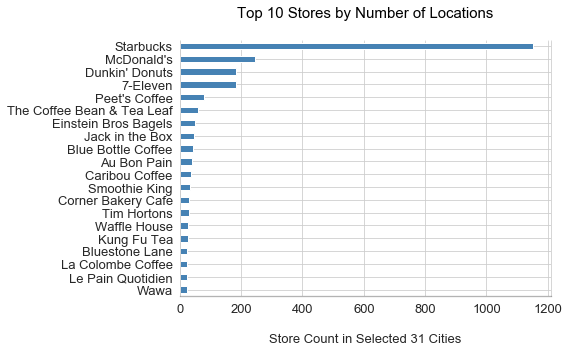

In [24]:
sns.set_style("whitegrid")

fig = plt.figure(figsize=(8,5))
ax  = fig.add_subplot()
temp = df_city.groupby(['Store_Name']).count()["Count"].sort_values(ascending=False)[:20]
ax = temp[::-1].plot(kind='barh', color='steelblue', fontsize=13)
plt.xlabel('\nStore Count in Selected 31 Cities', size=13)
plt.ylabel('')
plt.grid(zorder=0)
for pos in ['top']:#, 'right', 'left']:
        ax.spines[pos].set_color("#ffffff")
        ax.spines[pos].set_linewidth(1.3)
        ax.spines[pos].set_alpha(0.5)
for pos in ['bottom']:#, 'right', 'left']:
        ax.spines[pos].set_color("dimgray")
        ax.spines[pos].set_linewidth(1.3)
        ax.spines[pos].set_alpha(0.5)
plt.setp([ax.get_xticklines(), ax.get_yticklines()], color='dimgray')
ax.tick_params(axis=1, color='dimgray', labelcolor='dimgray')

plt.title('Top 10 Stores by Number of Locations\n', size=15, color='black')
plt.tight_layout()
plt.savefig('plots/store_loc_count.png')

In [25]:
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.transform import factor_cmap
from bokeh.palettes import inferno
from bokeh.io import show, output_notebook
temp = df_city.groupby(['Store_Name']).count()["Count"].sort_values(ascending=False)[:10]
stores = temp.index.tolist()
count = temp.values.tolist()
source = ColumnDataSource(data=dict(stores=stores, count=count))
p = figure(x_range=stores, plot_height=500, plot_width=900, toolbar_location=None, title="Top 10 Stores By Number of Locations")
renderers = p.vbar(x='stores', top='count', width=0.9, source=source,
                   line_color='white', fill_color=factor_cmap('stores', palette=inferno(len(stores)), factors=stores))
p.xgrid.grid_line_color = None
p.xaxis.major_label_orientation = math.pi/4
p.xaxis.major_label_text_font_size = "17pt"
my_hover = HoverTool()
my_hover.tooltips = [('Stores','@stores'),('Number of Locations','@count')]
p.add_tools(my_hover)
output_notebook()
show(p)

Loading BokehJS ...

In [26]:
#we will drop review_stdev as it seems to be some what covarying with mean _review _count
df_new.drop(columns=['mean_rating','mean_review_count'],axis=1,inplace=True)

## restrict to stores with>=10 coffee shop counts
data from very business sparse neighborhoods might not be truly reflective of coffee shop trends.

In [27]:

data_temp=df_new[df_new['Count']>=10]
#data_temp=df_new.copy(deep=True)

print(data_temp.shape)
Y=np.asarray(data_temp['Avg_Utility_Score'])
X=np.asarray(data_temp.loc[:,~data_temp.columns.isin(['loc_City','Avg_Utility_Score','Count'])])
print(X.shape,Y.shape)
             

(462, 18)
(462, 15) (462,)


## impute missing data with median value .Might introduce some bias in geometric mean 
## travel time but we will go with it.

In [28]:
columns=[col for col in data_temp.columns if col not in ['Avg_Utility_Score', 'Count','loc_City']]
from sklearn.preprocessing import Imputer
imputer = Imputer(missing_values = 'NaN', strategy = 'median', axis = 0)
imputer = imputer.fit(X)
X = imputer.transform(X)
scaler = preprocessing.MinMaxScaler()
minmax_scaled_df = scaler.fit_transform(X)
minmax_scaled_df = pd.DataFrame(minmax_scaled_df, 
                                columns=columns,index=data_temp.index) 
print(pd.DataFrame(data_temp['loc_City'],index=data_temp.index).shape)

minmax_scaled_df=pd.concat([minmax_scaled_df,pd.DataFrame(data_temp['loc_City'],index=data_temp.index)],axis=1)
minmax_scaled_df['loc_id'] = minmax_scaled_df.index + ', ' + minmax_scaled_df.loc_City
minmax_scaled_df.drop(columns=['loc_City'],inplace=True)
minmax_scaled_df.set_index('loc_id',drop=True,inplace=True)

minmax_scaled_df.head()

(462, 1)


/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:58: DeprecationWarning: Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.
  warnings.warn(msg, category=DeprecationWarning)


,coffee_shop_density,business_density,mean_price,mean_goog_search,Avg_income_neighborhood,geom_mean_tt,rating_stdev,review_stdev,pct_fancy_donuts,pct_bakeries,pct_corporate,pct_tea_and_juice,pct_grab_and_go,pct_third_wave,pct_independent
loc_id,,,,,,,,,,,,,,,
"Chinatown, Oakland",0.292811,0.162463,0.051282,0.168582,0.072918,0.356749,0.449923,0.190961,0.388889,0.595238,0.000000,0.333333,0.0,0.000000,0.833333
"Downtown, Oakland",0.383407,0.269191,0.373159,0.502229,0.057065,0.356749,0.182432,0.105089,0.297872,0.113982,0.127660,0.191489,0.0,0.000000,0.808511
"Lakeshore, Oakland",0.083321,0.023629,0.659341,0.452255,0.229995,0.356749,0.516212,0.270747,0.000000,0.255102,0.142857,0.214286,0.0,0.000000,0.785714
"Lakewide, Oakland",0.153645,0.114015,0.419580,0.480106,0.055951,0.356749,0.265368,0.086253,0.000000,0.162338,0.181818,0.000000,0.0,0.000000,0.863636
"Old City, Oakland",0.190100,0.111936,0.503497,0.684350,0.100152,0.356749,0.404727,0.151292,0.000000,0.000000,0.181818,0.000000,0.0,0.227273,0.727273


## lets inspect the most important features using a decission tree classifier.
Looks like thirdwave or not is very important in drawing a decission boundary.Being corporate chain or not doesnt seem to make much of a difference in business dense neighborhoods!!!

1.0


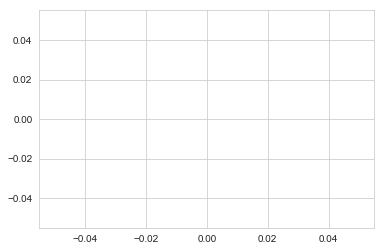

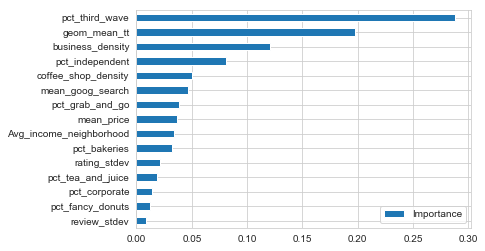

In [29]:
#X_train,X_test,Y_train,Y_test=train_test_split(projected,labels,test_size=0.2,random_state=42)
from sklearn.tree import DecisionTreeClassifier
def plot_model_var_imp( model , X , y,col_list ):
    imp = pd.DataFrame( 
        model.feature_importances_  , 
        columns = [ 'Importance' ] , 
        index = [item for item in col_list]
    )
    imp = imp.sort_values( [ 'Importance' ] , ascending = True )
    imp[ : ].plot( kind = 'barh' )
    print (model.score( X , y ))

def plot_variable_importance( X , y,col_list ):
    tree = DecisionTreeClassifier( random_state = 42 )
    tree.fit( X , y )
    plot_model_var_imp( tree , X , y,col_list )

n_clusters = 6
gmm = GaussianMixture(n_components=n_clusters).fit(minmax_scaled_df.values)
labels = gmm.predict(minmax_scaled_df.values)
#plt.scatter(projected[:, 0], projected[:, 1], c=labels, s=40, cmap='viridis')
#plt.savefig('plots/gmm_2d.png');
plt.plot()
X_train,X_test,Y_train,Y_test=train_test_split(minmax_scaled_df.values,labels,test_size=0.2,random_state=42)
plot_variable_importance(X_train,Y_train,list(minmax_scaled_df.columns))

## Agglomerative clustering
interesting outliar patterns emerge from here

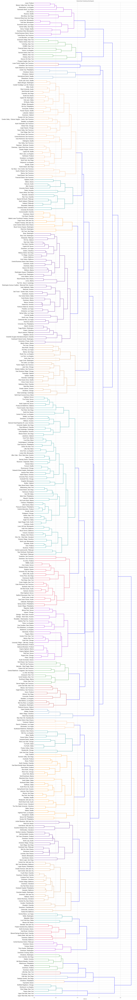

In [30]:
samples=minmax_scaled_df.values
labs = minmax_scaled_df.index
set_link_color_palette(['teal','sandybrown', 'steelblue', 'firebrick', 'forestgreen', 'darkviolet', 'crimson', 'darkcyan', 'peru', 'indigo', 'darkorange'])
fig, ax = plt.subplots(1, 1, figsize=(20,200))
ax.set_title('Hierarchical Clustering Dendrogram')
# plt.figure(figsize=(15, 100))
# plt.gcf()
ax.set_xlabel('distance')
ax.set_ylabel('name')
mergings = linkage(samples, method='complete')

dendo = dendrogram(mergings,
           labels=labs,
           leaf_rotation=0,
           leaf_font_size=14,
           color_threshold=1.0, # 1.2 gives 11 clusters
           orientation='right')
plt.savefig('plots/COFFEEdendo.png',dpi=320, format='png', bbox_inches='tight')


In [31]:
# create a dataframe with the colors listed in a column
a = pd.DataFrame(dendo['color_list'])
val_dict = dict(a.iloc[:,0].value_counts())
colors = a.iloc[:,0].unique()
color_list = []
for color in colors:
    if color != 'b':
        for i in range(val_dict[color] + 1):
            color_list.append(color)

neighb_colors = pd.DataFrame([color_list, dendo['ivl'], dendo['leaves']]).T
neighb_colors.rename({0:'color', 1:'City', 2:'leaf'}, axis=1,inplace=True)
neighb_colors = neighb_colors.set_index('City', drop=True)
len(neighb_colors['color'].unique())

12

## PCA(Principal Component Analysis)

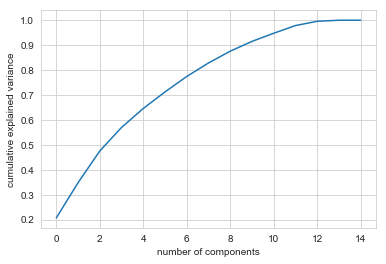

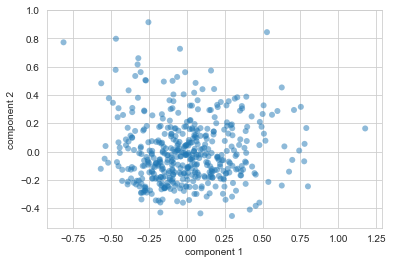

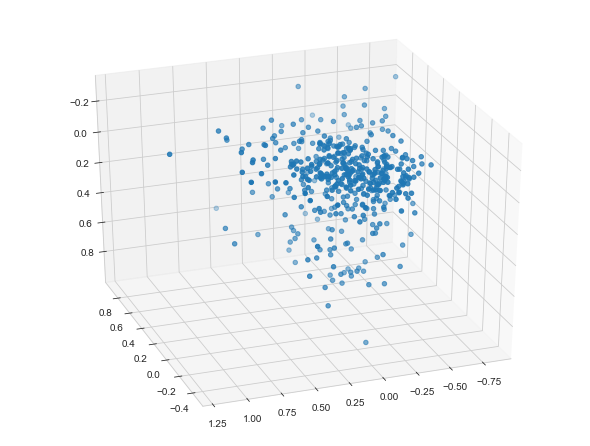

            Coffee Features  Component 1 weight  Component 2 weight  \
0       coffee_shop_density           -0.041412            0.131961   
1          business_density           -0.072370            0.170951   
2                mean_price           -0.182860            0.247483   
3          mean_goog_search            0.197782            0.136336   
4   Avg_income_neighborhood           -0.231129            0.364256   
5              geom_mean_tt           -0.041495            0.042720   
6              rating_stdev            0.510249           -0.189038   
7              review_stdev           -0.267859            0.287975   
8          pct_fancy_donuts            0.047789            0.125553   
9              pct_bakeries           -0.252319            0.101635   
10            pct_corporate            0.338087            0.397976   
11        pct_tea_and_juice            0.005206            0.049038   
12          pct_grab_and_go            0.382366           -0.022008   
13    

In [32]:
pca = PCA().fit(minmax_scaled_df.values)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.show()

pca = PCA(5)
projected = pca.fit_transform(minmax_scaled_df.values)
plt.scatter(projected[:, 0], projected[:, 1], edgecolor='none', alpha=0.5)
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.show()

fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(projected[:, 0], projected[:, 1], projected[:, 2])
plt.show()
# Display principal components
pcinfo = {}
pcinfo['Coffee Features'] = minmax_scaled_df.keys()
pcinfo['Component 1 weight'] = pca.components_[0]
pcinfo['Component 2 weight'] = pca.components_[1]
pcinfo['Component 3 weight'] = pca.components_[2]
pcinfo['Component 4 weight'] = pca.components_[3]
pcinfo['Component 5 weight'] = pca.components_[4]
print(pd.DataFrame.from_dict(pcinfo))
print('\nExplained variance from first 5 PCs:', pca.explained_variance_ratio_)

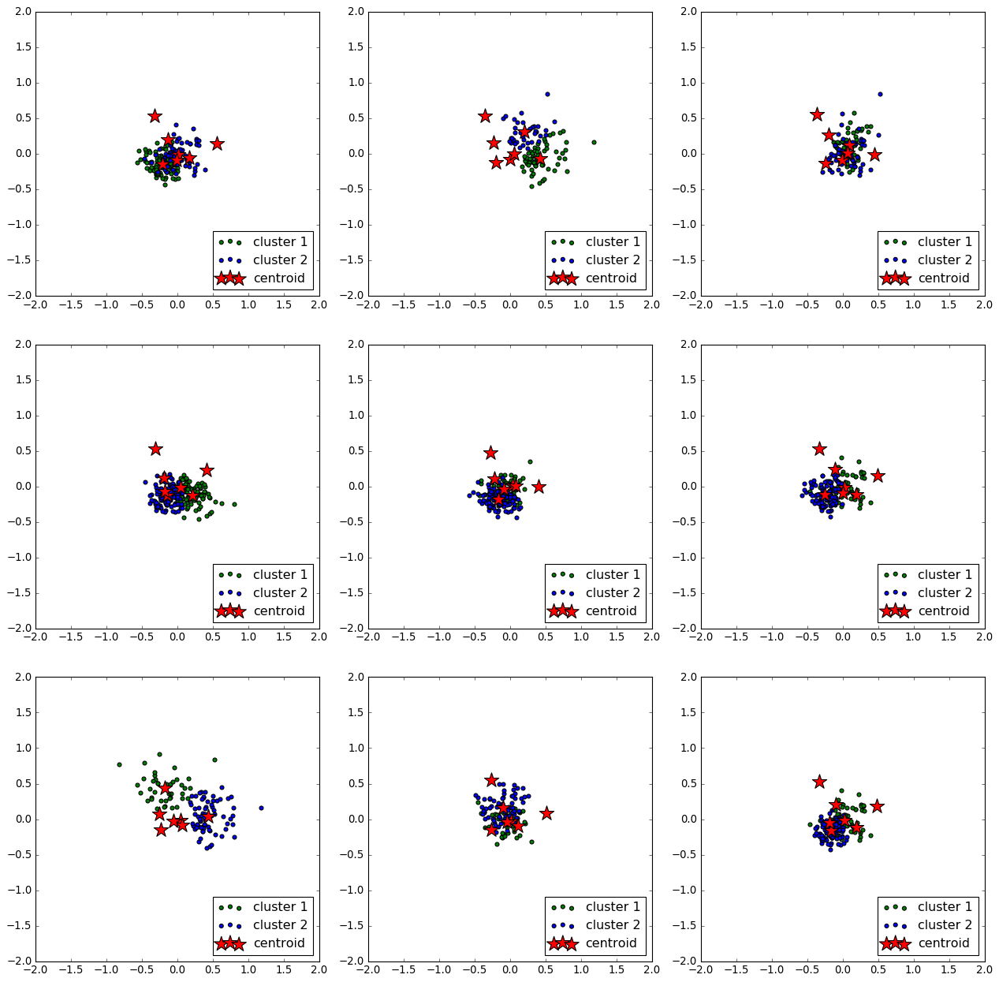

In [33]:

plt.style.use('classic')
plt.rcParams['figure.facecolor'] = '1'
n_iter = 9
fig, ax = plt.subplots(3, 3, figsize=(16, 16))
ax = np.ravel(ax)
centers = []
import random
for i in range(n_iter):
    # Run local implementation of kmeans
    kmeans = KMeans(n_clusters=7,
                    max_iter=3,
                    random_state=random.randint(0, 1000))
    labels=kmeans.fit(projected).predict(projected)
    centroids = kmeans.cluster_centers_
    centers.append(centroids)
    ax[i].scatter(projected[labels == 1, 0], projected[labels == 1, 1],
                  c='green', label='cluster 1')
    ax[i].scatter(projected[labels == 2, 0], projected[labels == 2, 1],
                  c='blue', label='cluster 2')
    ax[i].scatter(centroids[:, 0], centroids[:, 1],
                  c='r', marker='*', s=300, label='centroid')
    ax[i].set_xlim([-2, 2])
    ax[i].set_ylim([-2, 2])
    ax[i].legend(loc='lower right')
#     ax[i].set_title(f'{km.error:.4f}')
    ax[i].set_aspect('equal')
plt.tight_layout();
#roughly forms the same clusters with each iteration

## Run K means algorithm with n_clusters=7.Note:order is reversed,elbow plot was used to determine n_clusters=7
no clear cluster boundaries.Centers might be too close to each other to arrive at any deterministic conclusions.Overfitting!!!
Just tells us neighborhoods might have a continuous trend in coffee culture,might have to throw away more data to see a significant trend.Red and Yellow clusters look a little more promising and might show clearer boundaries in a pair of different dimensions.Spyder plots might reveal more which feature affects clusters most.

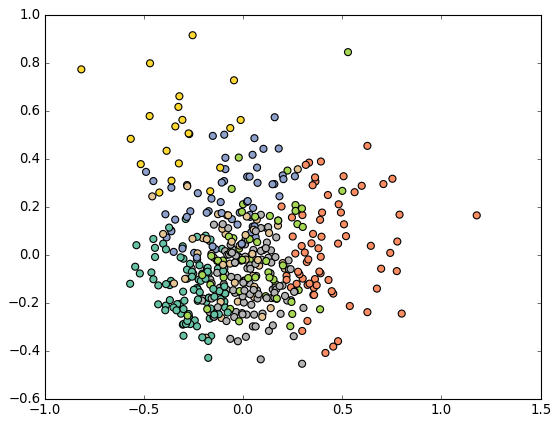

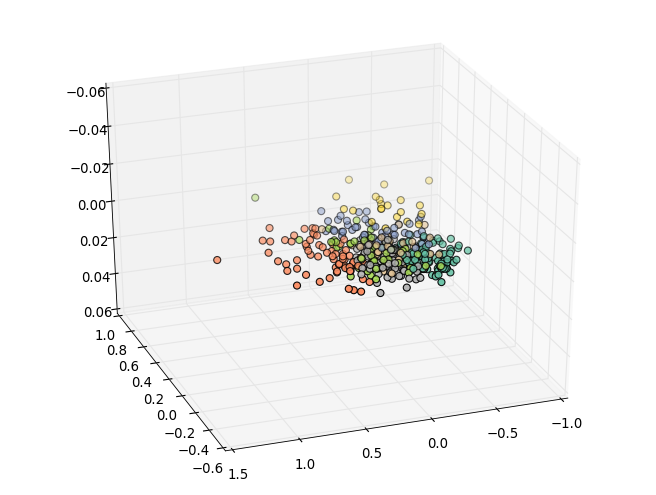

In [34]:
plt.style.use('classic')
plt.rcParams['figure.facecolor'] = '1'
n_clusters = 7
kmeans = KMeans(n_clusters, random_state=42)
labels = kmeans.fit(projected).predict(projected)
plt.scatter(projected[:, 0], projected[:, 1], c=labels, s=40, cmap='Set2');
plt.show()

fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)
ax.scatter(projected[:, 0], projected[:, 1], 
           c=labels, s=40, cmap='Set2')
plt.show()

For n_clusters=2, The Silhouette Coefficient is 0.19561013528728044
For n_clusters=3, The Silhouette Coefficient is 0.21825822413297732
For n_clusters=4, The Silhouette Coefficient is 0.22447090779170545
For n_clusters=5, The Silhouette Coefficient is 0.19786488116859707
For n_clusters=6, The Silhouette Coefficient is 0.20472678944067788
For n_clusters=7, The Silhouette Coefficient is 0.20528367951469387
For n_clusters=8, The Silhouette Coefficient is 0.20505518980280052
For n_clusters=9, The Silhouette Coefficient is 0.19956393891637111
For n_clusters=10, The Silhouette Coefficient is 0.19921054137761798
For n_clusters=11, The Silhouette Coefficient is 0.20233018910813627
For n_clusters=12, The Silhouette Coefficient is 0.19846979383102561
For n_clusters=13, The Silhouette Coefficient is 0.1749167701249399
For n_clusters=14, The Silhouette Coefficient is 0.18380221228037785
For n_clusters=15, The Silhouette Coefficient is 0.19497806550314464
For n_clusters=16, The Silhouette Coefficie

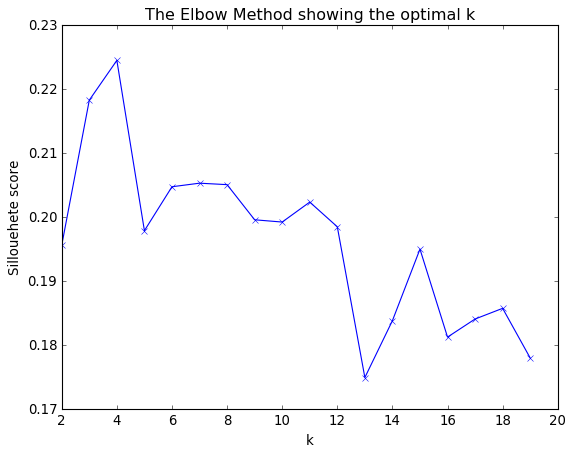

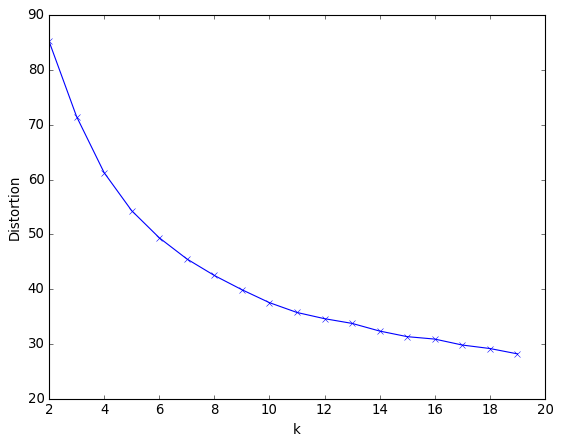

In [35]:
#make an elbow plot to decide the right number of clusters
from scipy.spatial.distance import cdist
from sklearn.metrics import silhouette_score
distortions = []
sil_coeff=[]
K = range(2,20)
for k in K:
    kmeanModel = KMeans(n_clusters=k,random_state=42)
    kmeanModel=kmeanModel.fit(projected)
    labels = kmeanModel.labels_
    sil_coeff.append(silhouette_score(projected, labels, metric='euclidean'))
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(k, silhouette_score(projected, labels, metric='euclidean')))
    distortions.append(kmeanModel.inertia_)
    

# Plot the elbow
plt.plot(K, sil_coeff, 'bx-')
plt.xlabel('k')
plt.ylabel('Sillouehete score')
plt.title('The Elbow Method showing the optimal k')
plt.show()
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
#plt.title('The Elbow Method showing the optimal k')

temp=np.array([np.array(xi) for xi in sil_coeff])

In [36]:
# #visually looks like k=5-7,lets go with k=7
# # now employe gmm with the same number of clusters
#gmm not shown here shows similar clusters


#Not shown:GMM forms similar clusters.

In [37]:
n_clusters = 7
gmm = GaussianMixture(n_components=n_clusters).fit(projected)
labels = gmm.predict(projected)
labels.shape
# plt.scatter(projected[:, 0], projected[:, 1], c=labels, s=40, cmap='viridis')
# plt.savefig('plots/gmm_2d.png');
# plt.plot()

(462,)

In [38]:
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.pipeline import FeatureUnion
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest
from sklearn.ensemble import GradientBoostingRegressor



In [39]:
X_train,X_test,Y_train,Y_test=train_test_split(projected,Y,test_size=0.2,random_state=42)

In [40]:
#before we proceed to training with ML algorithms lets have a comprehensive idea of our dataset
# our model could be linear but lets verfiy this 
import statsmodels.api as sm
from statsmodels.formula.api import ols
## This line is very important, we add this line so that our linear model will have a constant term, which takes the generalized 
## linear form

X_train_b0=sm.add_constant(X_train)
fit1=sm.OLS(Y_train,X_train_b0).fit()
fit1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.687
Model:                            OLS   Adj. R-squared:                  0.682
Method:                 Least Squares   F-statistic:                     159.1
Date:                Thu, 11 Jul 2019   Prob (F-statistic):           3.53e-89
Time:                        10:10:11   Log-Likelihood:                -2726.9
No. Observations:                 369   AIC:                             5466.
Df Residuals:                     363   BIC:                             5489.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1083.6882     20.610     52.581      0.000    1043.159    1124.218
x1         -1449.9464     77.010    -18.828      0.000   -1601.388   -1298.505
x2           909.0783     92.893      9.786      0.000     726.402    1091.755
x3            36.4500     95.562      0.381      0.703    -151.474     224.374
x4         -1070.0115    112.837     -9.483      0.000   -1291.908    -848.115
x5          2072.2610    124.772     16.608      0.000    1826.894    2317.628
==============================================================================
Omnibus:                       15.037   Durbin-Watson:                   1.875
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               17.049
Skew:                           0.414   Prob(JB):                     0.000199
Kurtosis:                       3.651   Cond. No.                         6.08
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

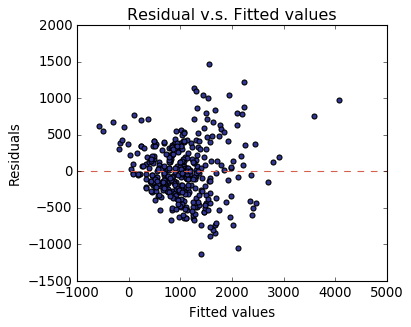

In [41]:
fig,ax=plt.subplots(1,1,figsize=(5,4))

ax.scatter(fit1.fittedvalues,fit1.resid,s=20,c='#313695')
ax.set_xlabel('Fitted values')
ax.set_ylabel('Residuals')
ax.set_title('Residual v.s. Fitted values')

ax.axhline(y=0,ls='--',c='#d6604d')

Text(0.5, 1.0, 'Q-Q Plot')

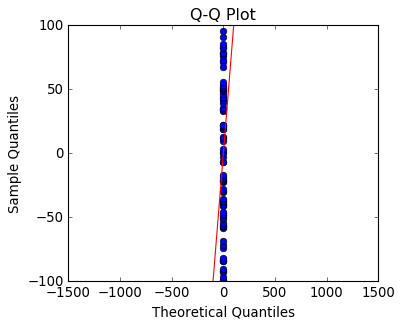

In [42]:
fig,ax=plt.subplots(1,1,figsize=(5,4))
probplot = sm.ProbPlot(fit1.resid)
probplot.qqplot(line='45', ax=ax)
ax.set_ylim([-100,100])
ax.set_title('Q-Q Plot')

Points are roughly clustered around the estimated regression line for the residuals vs fitted value.
Slight skew in the Gaussian for the qq plot but distribution is still sufficiently normal to use a parametric model.
## Some scratch model testing below

In [43]:
#moving on to KNN regression
param_grid = {'n_neighbors': [1, 3, 5, 7, 9],
              'p': [1, 2, 3, 5, 10],'weights': ["uniform", "distance"]}

knn = KNeighborsRegressor()

knn_cv = GridSearchCV(knn, param_grid, scoring='neg_mean_absolute_error', cv=5, n_jobs = -1, verbose = 2)
knn_cv.fit(X_train, Y_train)

print("Best Score (r^2 value): %f" % knn_cv.best_score_)
print("Optimal Hyperparameter Values: ", knn_cv.best_params_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.0s


Best Score (r^2 value): -324.454789
Optimal Hyperparameter Values:  {'n_neighbors': 7, 'p': 3, 'weights': 'distance'}


[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:    2.3s finished
/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [44]:
# from sklearn.metrics import mean_squared_error, r2_score
# n_neighbors_opt =23
# p_opt = 1
# weights_opt = 'distance'

# knn_cv = KNeighborsRegressor(n_neighbors=n_neighbors_opt, p=p_opt,weights=weights_opt)
# knn_cv.fit(X_train, Y_train)
# Y_train_pred = knn_cv.predict(X_train)

# Y_train_pred.shape
# print('The mean squared error of this prediction is %f' %mean_squared_error(Y_train, Y_train_pred))
# print('The r^2 value for this prediction is %f' %r2_score(Y_train,Y_train_pred))

In [45]:
# from sklearn.metrics import mean_squared_error, r2_score

# # Predict missing values in X_test
# Y_test_pred = knn_cv.predict(X_test)

# print('The mean squared error of this prediction is %f' %mean_squared_error(Y_test, Y_test_pred))
#print('The r^2 value for this prediction is %f' %r2_score(Y_test,Y_test_pred))

# Preliminary estimates of 'MSE' and'R^2' on linear regression models

In [46]:
from sklearn.ensemble import RandomForestRegressor
num_folds=5  ## k-fold cross validation parameter
seed=42
scoring='neg_mean_squared_error' ## the metric for linear regression accuracy, be careful, this is negative value, so we a expecting  the maximum value
## Algorithm comparison table
models=[]
models.append(('LR',LinearRegression()))
models.append(('RR',Ridge()))
models.append(('BR',BayesianRidge()))
models.append(('LASSO',Lasso()))
models.append(('EN',ElasticNet()))
models.append(('KNN',KNeighborsRegressor()))
models.append(('SVR',SVR()))
models.append(('RF',RandomForestRegressor()))
# evaluate each model in turn

results=[]
names=[]
#compare['MinMaxScaled with PCA']=[]
for name,model in models:
    kfold=KFold(n_splits=num_folds,random_state=seed)
    cv_results=cross_val_score(model,X_train,Y_train,cv=kfold,scoring=scoring)
    results.append(cv_results)
    names.append(name)
    #compare['MinMaxScaled with PCA'].append(cv_results.mean())
    msg="%s:%f (%f)" % (name,cv_results.mean(),cv_results.std())
    print(msg)

LR:-160948.588351 (9677.915132)
RR:-162922.823447 (14367.596347)
BR:-160953.485087 (10036.783085)
LASSO:-160704.585812 (10606.581863)
EN:-438558.293622 (96588.126424)
KNN:-202654.727588 (35990.834333)
SVR:-506875.659248 (120356.419000)
RF:-210454.720696 (34457.791873)


/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:196: FutureWarning: The default 

[Text(0, 0, 'LR'),
 Text(0, 0, 'RR'),
 Text(0, 0, 'BR'),
 Text(0, 0, 'LASSO'),
 Text(0, 0, 'EN'),
 Text(0, 0, 'KNN'),
 Text(0, 0, 'SVR'),
 Text(0, 0, 'RF')]

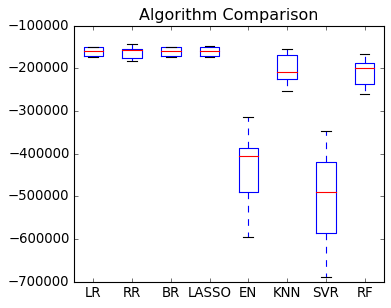

In [47]:
fig,ax=plt.subplots(1,1,figsize=(5,4))

ax.set_title('Algorithm Comparison')
ax.boxplot(results)
ax.set_xticklabels(names)


## Surprisingly a neural network gives a lowered MSE but they are prone to overfitting especially with only 400+ instances such as this. Ensemble learning approaches can overfit as well!!1

In [48]:
#Tensor flow 2 layer fully connected
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import KFold
learning_rate = 0.1
epoch_list = [1000]
batch_sizes = [100]

# Network Parameters
num_neurons_layer1_list = [100] # 1st layer number of neurons
num_neurons_layer2_list = [60] # 2nd layer number of neurons


Using TensorFlow backend.


In [49]:
# define our model,two densely connected layers with one output layer
def base_architecture_2hidden(num_neurons_layer1,num_neurons_layer2,X_train_clnd):
    #create model
    model=Sequential()
    #the input layer
    model.add(Dense(X_train_clnd.shape[1], input_dim=X_train_clnd.shape[1],
                    kernel_initializer='normal', activation='relu'))
    # The Hidden Layers :
    model.add(Dense(int(num_neurons_layer1), kernel_initializer='normal',activation='relu'))
    model.add(Dense(int(num_neurons_layer2), kernel_initializer='normal',activation='relu'))
    # the Output Layers:
    model.add(Dense(1, kernel_initializer='normal'))
    # Compile the network :
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error'])
    return model

In [50]:
# We now use k-fold cross-validation to find the optimal hyperparameters
input_dims = X_train.shape[1]
seed = 42
# kfold = KFold(n_splits=6, random_state=seed)
cvscores=[]
kfold = KFold(n_splits=5, shuffle=True, random_state=seed)
name='base_architecture_2hidden'
model_performance_list = np.empty([1,2]) # Initialize as empty
num_comb = len(epoch_list)*len(batch_sizes)*len(num_neurons_layer1_list)*len(num_neurons_layer2_list)
count=1
for epoch in epoch_list:
    for curr_batch_size in batch_sizes:
        for num_neurons_l1 in num_neurons_layer1_list:
            for num_neurons_l2 in num_neurons_layer2_list:
                print('Looking at combination %i of %i' %(count,num_comb))
                count+=1

                model = base_architecture_2hidden(num_neurons_l1,num_neurons_l2,X_train)
                model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse'])

                curr_score_list = []
                count_fold = 1
                for train, test in kfold.split(X_train, Y_train):

                    count_fold += 1

                    model.fit(X_train[train], Y_train[train],
                                       epochs=epoch, batch_size=curr_batch_size, verbose=0)
                    scores = model.evaluate(X_train[test], Y_train[test], verbose=0)
                    curr_score_list.append(scores[1])
                curr_avg_score = np.mean(curr_score_list)
                curr_std_dev=np.std(curr_score_list)

                model_performance_list=np.vstack((model_performance_list,
                                              [curr_avg_score,curr_std_dev]))
    
# Remove first row from model_performance_list as it contained the random values used to initialize it
model_performance_list=np.delete(model_performance_list, [0], axis=0)
msg="%s:%f (%f)" % (name,model_performance_list[0,0],model_performance_list[0,1])
print(msg)

Looking at combination 1 of 1
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
base_architecture_2hidden:147794.809779 (17519.629672)


In [51]:
#Ensemble learning pipelines
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor



In [52]:
#Ensemble methods
num_folds=5  ## k-fold cross validation parameter
seed=42
scoring='neg_mean_squared_error' ## the metric for linear regression accuracy, be careful, this is negative value, so we a expecting  the maximum value
## Algorithm comparison table
models=[]
models.append(('GBR',GradientBoostingRegressor()))
models.append(('ETR',ExtraTreesRegressor()))
models.append(('ADB',AdaBoostRegressor()))
results=[]
names=[]
#compare['MinMaxScaled with PCA']=[]
for name,model in models:
    kfold=KFold(n_splits=num_folds,random_state=seed)
    cv_results=cross_val_score(model,X_train,Y_train,cv=kfold,scoring=scoring)
    results.append(cv_results)
    names.append(name)
    #compare['MinMaxScaled with PCA'].append(cv_results.mean())
    msg="%s:%f (%f)" % (name,cv_results.mean(),cv_results.std())
    print(msg)

GBR:-192409.508864 (38910.227313)
ETR:-213829.672663 (53538.014289)


/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The de

ADB:-219492.090450 (44516.522126)


In [53]:
#pick SVR for non-parametric and Bayesian ridge for parametric,average the results of the two regression models
#Tuning parameters of SVR
# c_values=[0.1,0.3,0.5,0.7,0.9,1.0,1.3,1.5,1.7,2.0]
# kernel_values=['linear','poly','rbf','sigmoid']
# param_grid=dict(C=c_values,kernel=kernel_values)
# model=SVR()
# kfold=KFold(n_splits=num_folds,random_state=seed)
# grid=GridSearchCV(estimator=model,param_grid=param_grid,scoring=scoring,cv=kfold)
# grid_result=grid.fit(X_train,Y_train)
# print ("Best: %f using %s"%(grid_result.best_score_,grid_result.best_params_))
# means=grid_result.cv_results_['mean_test_score']
# stds=grid_result.cv_results_['std_test_score']
# params=grid_result.cv_results_['params']

# for mean,stdev,param in zip(means,stds,params):
#     print ("%f (%f) with: %r" % (mean,stdev,param))
    


In [54]:
# param_grid = {'alpha_2': [0.1, 0.01, 0.001,0.02, 0.024, 0.025, 0.026, 0.03],'alpha_2': [0.1, 0.01, 0.001,0.02, 0.024, 0.025, 0.026, 0.03] ,
#                'n_iter':[100, 400, 1000, 10000]}
from sklearn.metrics import mean_squared_error, r2_score
param_grid = {'alpha': [0.1, 0.01, 0.001,0.02, 0.024, 0.025, 0.026, 0.03],'max_iter':[100, 400, 1000, 10000]}              
model=Lasso()
kfold=KFold(n_splits=8,random_state=seed)
grid=GridSearchCV(estimator=model,param_grid=param_grid,scoring=scoring,cv=kfold)
grid_result=grid.fit(X_train,Y_train)
print ("Best: %f using %s"%(grid_result.best_score_,grid_result.best_params_))
means=grid_result.cv_results_['mean_test_score']
stds=grid_result.cv_results_['std_test_score']
params=grid_result.cv_results_['params']

for mean,stdev,param in zip(means,stds,params):
    print ("%f (%f) with: %r" % (mean,stdev,param))



Best: -159050.516562 using {'alpha': 0.1, 'max_iter': 100}
-159050.516562 (27696.416283) with: {'alpha': 0.1, 'max_iter': 100}
-159050.516562 (27696.416283) with: {'alpha': 0.1, 'max_iter': 400}
-159050.516562 (27696.416283) with: {'alpha': 0.1, 'max_iter': 1000}
-159050.516562 (27696.416283) with: {'alpha': 0.1, 'max_iter': 10000}
-159059.281124 (27612.887481) with: {'alpha': 0.01, 'max_iter': 100}
-159059.281124 (27612.887481) with: {'alpha': 0.01, 'max_iter': 400}
-159059.281124 (27612.887481) with: {'alpha': 0.01, 'max_iter': 1000}
-159059.281124 (27612.887481) with: {'alpha': 0.01, 'max_iter': 10000}
-159060.280222 (27604.576767) with: {'alpha': 0.001, 'max_iter': 100}
-159060.280222 (27604.576767) with: {'alpha': 0.001, 'max_iter': 400}
-159060.280222 (27604.576767) with: {'alpha': 0.001, 'max_iter': 1000}
-159060.280222 (27604.576767) with: {'alpha': 0.001, 'max_iter': 10000}
-159058.200902 (27622.125867) with: {'alpha': 0.02, 'max_iter': 100}
-159058.200902 (27622.125867) with:

/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [55]:
#finalize model with optimized hyper parameters
# model=SVR(kernel='rbf', C=2)
# model.fit(X_train,Y_train)
# predictions_SVR=model.predict(X_test)
# print('The mean squared error of this prediction is %f' %mean_squared_error(Y_test, predictions_SVR))
# print('The r^2 value for this prediction is %f' %r2_score(Y_test,predictions_SVR))

## Lasso regression
Minor overfitting but good r^2 score. This will be (as of now) our final model.

In [56]:
import pickle
model=Lasso(alpha=0.1,max_iter= 100)
model.fit(X_train,Y_train)
path = 'coffee_data/COFFEE'
# save the model to disk
filename = path+'/'+'finalized_Lasso_model.sav'
pickle.dump(model, open(filename, 'wb'))

predictions_BR=model.predict(X_test)

print('The mean squared error of this prediction is %f' %mean_squared_error(Y_test, predictions_BR))
print('The r^2 value for this prediction is %f' %r2_score(Y_test,predictions_BR))


The mean squared error of this prediction is 204693.264199
The r^2 value for this prediction is 0.722175


In [57]:
# predictions_avg=np.mean( np.hstack(( predictions_BR.reshape(-1,1), predictions_SVR.reshape(-1,1))), axis=1 )
# #print(predictions_avg.shape)

In [58]:
# print('The mean squared error of this prediction is %f' %mean_squared_error(Y_test, predictions_avg))
# print('The r^2 value for this prediction is %f' %r2_score(Y_test,predictions_avg))

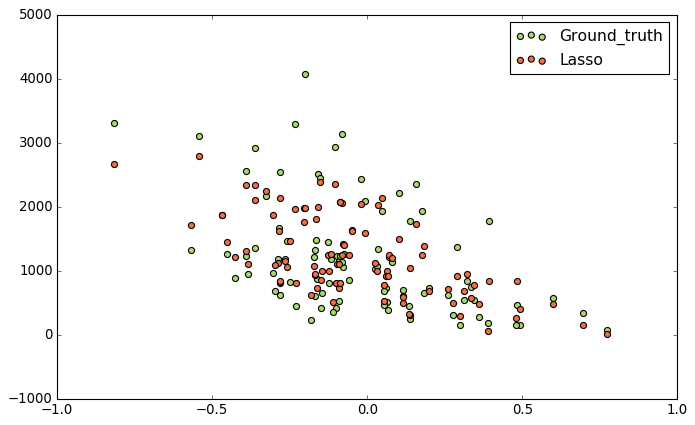

In [59]:
plt.figure(figsize=(10, 6))
plt.scatter(X_test[:,0], Y_test, s=30,c='#a6d96a',label='Ground_truth')
plt.scatter(X_test[:,0], predictions_BR, s=30,c='#f46d43',label='Lasso')
plt.legend(loc="best", fontsize=14) 
plt.show()

## Compare between clusters generated by K-means and GMM. Hence identify the two features that were possibly most discriminatory. 
also shows the neighborhoods grouped by cluster labels from each algorithm.

In [60]:
#rerun labels for gmm and k means with n=7 clusters
# plt.style.use('classic')
# plt.rcParams['figure.facecolor'] = '1'
n_clusters = 7
kmeans = KMeans(n_clusters, random_state=42)
labels_kmeans = kmeans.fit(projected).predict(projected)
gmm = GaussianMixture(n_components=n_clusters).fit(projected)
labels_GMM = gmm.predict(projected)


In [61]:
data_temp['labels'] = labels_kmeans
data_temp.reset_index(inplace=True)


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [62]:
a = data_temp.sort_values('labels')
a = a.groupby(['labels', 'loc_City', 'loc_neighborhood']).mean()

for i in range(n_clusters):
    temp = a.loc[i].reset_index()
    print(i, 'count:', len(temp))

for i in range(n_clusters):
    if i > 0:
        print('\n')
    print('****', i, '****')
    temp = a.loc[i].reset_index()
    print('count:', len(temp))
    city_temp = ''
    for j in range(len(temp)):
        if temp.loc[j].loc_City != city_temp:
            city_temp = temp.iloc[j].loc_City
            print('--------------')
            print(city_temp)
            print('--------------')
        print (temp.loc[j].loc_neighborhood)

0 count: 92
1 count: 69
2 count: 60
3 count: 56
4 count: 21
5 count: 47
6 count: 113
**** 0 ****
count: 92
--------------
Atlanta
--------------
Buckhead Village
Grant Park
Virginia Highland
--------------
Austin
--------------
Barton Hills
Crestview
East Cesar Chavez
Govalle
Holly
Old West Austin
South Lamar
Upper Boggy Creek
--------------
Boston
--------------
Jamaica Plain
--------------
Cambridge
--------------
Cambridgeport
--------------
Chicago
--------------
Bridgeport
East Ukrainian Village
Humboldt Park
Hyde Park
Logan Square
Pilsen
Ravenswood
Rogers Park
--------------
Dallas
--------------
Eagle Ford
Oak Cliff
--------------
Denver
--------------
Berkeley
Five Points
Highland
Platt Park
West Highland
--------------
Honolulu
--------------
Kaimuki
Kalihi-Palama
McCully-Moiliili
--------------
Houston
--------------
Greater Heights
Greenway - Upper Kirby Area
--------------
Las Vegas
--------------
Buffalo
--------------
Los Angeles
--------------
Downtown
Echo Park
Highland

Central Lawrenceville
Shadyside
Southside Flats
Strip District
--------------
Portland
--------------
Northwest
Old Town-Chinatown
--------------
Salt Lake City
--------------
Downtown
East Central
Sugar House
--------------
San Diego
--------------
Barrio Logan
East Village
Midway District
Mission Beach
Old Town
Torrey Pines
University Heights
--------------
Seattle
--------------
Pioneer Square
South Lake Union
West Queen Anne
--------------
Washington
--------------
Columbia Heights
Mount Vernon Square
Navy Yard
Near Northeast
Shaw


In [63]:
#print out group info
minmax_scaled_df['labels'] = labels_kmeans
a = minmax_scaled_df.groupby('labels').mean()
#a = data_temp.groupby('labels').mean()

a.iloc[:,:].T

labels,0,1,2,3,4,5,6
coffee_shop_density,0.055451,0.066786,0.171434,0.043986,0.100276,0.104882,0.078090
business_density,0.035276,0.032909,0.156563,0.022341,0.145242,0.061978,0.044432
mean_price,0.470849,0.371041,0.567121,0.428941,0.634583,0.334903,0.524191
mean_goog_search,0.315380,0.479117,0.428151,0.410490,0.462767,0.320412,0.489037
Avg_income_neighborhood,0.189458,0.099039,0.225030,0.141398,0.573031,0.189027,0.114922
geom_mean_tt,0.367442,0.352005,0.398107,0.369881,0.356749,0.403710,0.343911
rating_stdev,0.193127,0.556783,0.274109,0.335622,0.149539,0.306235,0.399102
review_stdev,0.204017,0.095000,0.439243,0.149223,0.301260,0.149963,0.167062
pct_fancy_donuts,0.063147,0.060920,0.098186,0.578900,0.132461,0.054220,0.047009
pct_bakeries,0.317341,0.176265,0.181715,0.211817,0.403459,0.471469,0.164501


In [64]:
k_means = minmax_scaled_df[['labels']]

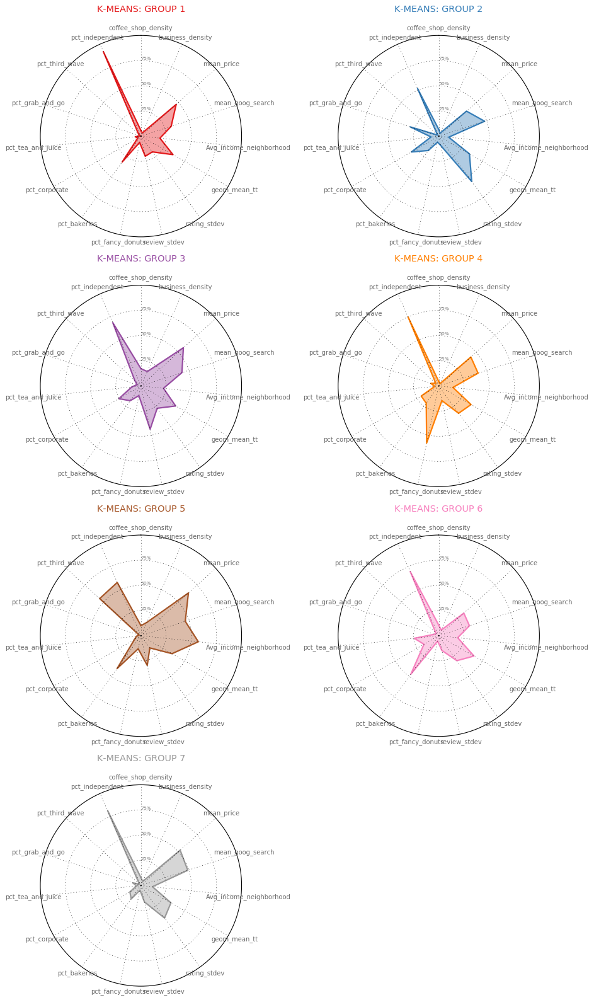

In [65]:
df = a.iloc[:,:].reset_index()#all rows belonging to all columns
df.head()
 
def make_spider_plot( row, title, color):

    categories=list(df)[1:]
    N = len(categories)

    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    
    ax = plt.subplot(round(n_clusters/2), 2, row+1, polar=True)

    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    plt.xticks(angles[:-1], categories, color='dimgray', size=9)

    ax.set_rlabel_position(0)
    plt.yticks([0.25,0.5,0.75], ["25%","50%","75%"], color="grey", size=7)
    plt.ylim(0,1)

    values=df.loc[row].drop('labels').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    title = 'K-MEANS: GROUP ' + str(int(title)+1)
    plt.title(title, size=13, color=color, y=1.1)
    plt.tight_layout()

my_dpi=96
plt.figure(figsize=(12, 20))#, dpi=my_dpi)

my_palette = plt.cm.get_cmap("Set1", len(df.index))

for row in range(n_clusters):
    make_spider_plot(row=row, title=df['labels'][row], color=my_palette(row))
plt.tight_layout()
plt.savefig('plots/km.png')


In [66]:
data_temp.drop(columns='labels',inplace=True)
data_temp['labels'] = labels_GMM


/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [67]:
a = data_temp.sort_values('labels')
a = a.groupby(['labels', 'loc_City', 'loc_neighborhood']).mean()

for i in range(n_clusters):
    temp = a.loc[i].reset_index()
    print(i, 'count:', len(temp))

for i in range(n_clusters):
    if i > 0:
        print('\n')
    print('****', i, '****')
    temp = a.loc[i].reset_index()
    print('count:', len(temp))
    city_temp = ''
    for j in range(len(temp)):
        if temp.loc[j].loc_City != city_temp:
            city_temp = temp.iloc[j].loc_City
            print('--------------')
            print(city_temp)
            print('--------------')
        print (temp.loc[j].loc_neighborhood)

0 count: 104
1 count: 32
2 count: 33
3 count: 42
4 count: 51
5 count: 63
6 count: 133
**** 0 ****
count: 104
--------------
Atlanta
--------------
Buckhead Village
Grant Park
Lenox
Virginia Highland
--------------
Austin
--------------
Brentwood
Crestview
East Cesar Chavez
Govalle
North Loop
Old West Austin
Rosedale
South Lamar
Upper Boggy Creek
--------------
Baltimore
--------------
Charles Village
Fells Point
Hampden
Mount Vernon
--------------
Boston
--------------
Jamaica Plain
South Dorchester
--------------
Boulder
--------------
West Pearl
Whittier
--------------
Cambridge
--------------
Cambridgeport
East Cambridge
--------------
Charlotte
--------------
Barclay Downs
Commonwealth
Downtown Charlotte
York Road
--------------
Charlottesville
--------------
Downtown
--------------
Chicago
--------------
Bridgeport
East Ukrainian Village
Humboldt Park
Hyde Park
Pilsen
Ravenswood
Rogers Park
Ukrainian Village
University Village - Little Italy
--------------
Cleveland
--------------

Tri-Village
--------------
Dallas
--------------
Near East
--------------
Denver
--------------
Athmar Park
Capitol Hill
Cherry Creek
City Park West
Civic Center
Congress Park
North Capitol Hill
Stapleton
Union Station
--------------
Honolulu
--------------
Airport
Ala Moana-Kakaako
Hawaii Kai
Kuliouou-Kalani Iki
Liliha-Kapalama
Manoa
McCully-Moiliili
Palolo
Waialae-Kahala
--------------
Houston
--------------
Alief
Eldridge - West Oaks
Greater Uptown
Midtown
Oak Forest - Garden Oaks
Sharpstown
University Place
Woodlake - Briarmeadow
--------------
Las Vegas
--------------
Buffalo
The Lakes
--------------
Los Angeles
--------------
Central City East
Palms
Pico-Robertson
Sawtelle
Westwood
--------------
Miami
--------------
Alameda - West Flagler
--------------
Minneapolis
--------------
North Loop
--------------
New Orleans
--------------
Central Business District
East Carollton
French Quarter
Lower Garden District
West Riverside
--------------
Oakland
--------------
Lakeshore
Old City

In [68]:
#print out group info
minmax_scaled_df['labels'] = labels_GMM
a = minmax_scaled_df.groupby('labels').mean()
#a = data_temp.groupby('labels').mean()

a.iloc[:,:].T

labels,0,1,2,3,4,5,6
coffee_shop_density,0.057640,0.119882,0.136785,0.079535,0.057114,0.111102,0.080492
business_density,0.033250,0.088455,0.178293,0.047953,0.029000,0.081161,0.047813
mean_price,0.501523,0.481313,0.629011,0.405031,0.452287,0.476482,0.426505
mean_goog_search,0.412340,0.529862,0.428784,0.409515,0.408762,0.406280,0.397654
Avg_income_neighborhood,0.148078,0.180624,0.432207,0.191226,0.145096,0.150068,0.145383
geom_mean_tt,0.354851,0.362583,0.357771,0.384456,0.365895,0.369652,0.373325
rating_stdev,0.280224,0.378028,0.195207,0.350346,0.294877,0.342383,0.411723
review_stdev,0.128079,0.185612,0.448138,0.147270,0.192723,0.262053,0.194181
pct_fancy_donuts,0.000000,0.003170,0.136364,0.463644,0.496638,0.155774,0.000324
pct_bakeries,0.302080,0.205972,0.316896,0.304094,0.196864,0.159520,0.241982


In [69]:
gmm = minmax_scaled_df[['labels']]

In [70]:
df = a.iloc[:,:].reset_index()

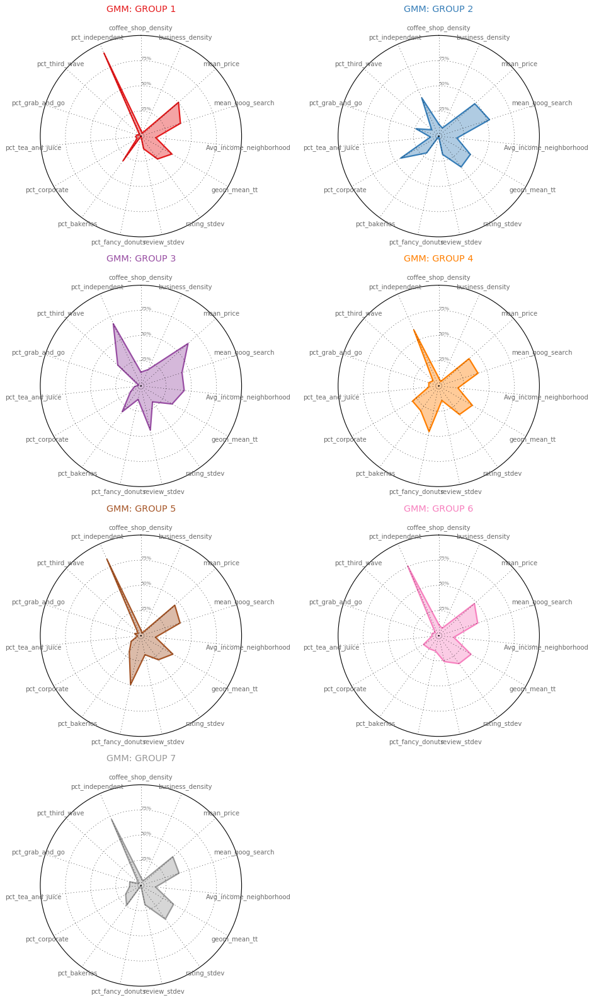

In [71]:
def make_spider( row, title, color):

    categories=list(df)[1:]
    N = len(categories)

    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    
    ax = plt.subplot(round(n_clusters/2), 2, row+1, polar=True)

    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)

    plt.xticks(angles[:-1], categories, color='dimgray', size=9)

    ax.set_rlabel_position(0)
    plt.yticks([0.25,0.5,0.75], ["25%","50%","75%"], color="grey", size=7)
    plt.ylim(0,1)

    values=df.loc[row].drop('labels').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    title = 'GMM: GROUP ' + str(int(title)+1)
    plt.title(title, size=13, color=color, y=1.1)
    plt.tight_layout()

my_dpi=96
plt.figure(figsize=(12, 20))#, dpi=my_dpi)

my_palette = plt.cm.get_cmap("Set1", len(df.index))

for row in range(n_clusters):
    make_spider(row=row, title=df['labels'][row], color=my_palette(row))
plt.tight_layout()
plt.savefig('plots/gmm.png')

    
    

In [72]:
#make spyder plots using bokeh if possible
from bokeh.plotting import figure, show, output_file
from bokeh.io import show, output_notebook
from bokeh.layouts import column
from bokeh.models import ColumnDataSource, LabelSet
import matplotlib as mpl
import itertools 
print(n_clusters) 
plots=[]
def unit_poly_verts(theta, centre ):
    
        
    """Return vertices of polygon for subplot axes.
    This polygon is circumscribed by a unit circle centered at (0.5, 0.5)
    """
    x0, y0, r = [centre ] * 3
    verts = [(r*np.cos(t) + x0, r*np.sin(t) + y0) for t in theta]
    return verts
def radar_patch(r, theta, centre ):
    """ Returns the x and y coordinates corresponding to the magnitudes of 
    each variable displayed in the radar plot
    """
    # offset from centre of circle
    offset = 0.01
    yt = (r*centre + offset) * np.sin(theta) + centre 
    xt = (r*centre + offset) * np.cos(theta) + centre 
    return xt, yt
def make_spyder_bokeh(row, title,color):
    centre=0.5
    categories=list(df)[1:]
    N = len(categories)

    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    verts = unit_poly_verts(angles, centre)
    x = [v[0] for v in verts] 
    y = [v[1] for v in verts] 
    title = 'GMM: GROUP ' + str(int(title)+1)
    p = figure(title=title)
    text=categories
    source = ColumnDataSource({'x':x + [centre ],'y':y + [1],'text':text})
    p.line(x="x", y="y", source=source)

    labels = LabelSet(x="x",y="y",text="text",source=source)

    p.add_layout(labels)
    values=df.loc[row].drop('labels').values.flatten().tolist()
    values += values[:1]
    values=np.asarray(values)
    #print(values)
    xt, yt = radar_patch(values, angles, centre)
    p.patch(x=xt, y=yt, fill_alpha=0.15, fill_color=color)
    return p
#my_palette = plt.cm.get_cmap("Set1", len(df.index))   
colors = ['blue','green','red', 'orange','purple','gray','black']
print(type(colors))
output_file("layout.html")
for row in range(n_clusters):
    p=make_spyder_bokeh(row=row, title=df['labels'][row], color=colors[row])
    plots.append(p)
print(n_clusters)    
output_notebook()  
show(column(*plots))
    

7
<class 'list'>
7


Loading BokehJS ...

In [73]:

#pct independent appears very important.lets look at its top neighborhoods per
df_pct_independent=data_temp.groupby(['loc_City']).apply(lambda x: x.sort_values(["pct_independent"], ascending = False)).reset_index(drop=True)
temp_city=list(df_pct_independent.loc_City.unique())
#fig, ax = plt.subplots(3, 3, figsize=(16, 16))
#fig, ax = plt.subplots(figsize=(16,16))

for item in temp_city:
    
    
    temp=df_pct_independent.loc[df_pct_independent['loc_City']==item].reset_index(drop=True)
    
#     l = list(range(1, (len(temp)+1)))
#     ax.scatter(l,temp['pct_independent'],s=20,c='#313695')
#     ax.set_xlabel(item)
#     ax.set_ylabel('Percentage of independent coffeeshops')
#     ax.set_xticklabels(temp['loc_neighborhood'], fontsize=9)
#     ax.grid(True)
    
#     #ax.xticks(l,temp['loc_neighborhood'], color='dimgray', size=9)
# plt.show()    
    
# # ax  = fig.add_subplot()
    print('Top 5 neighborhoods for', item, 'in pct_independent')
    print('***************************')
    print(temp.head(5))
 

Top 5 neighborhoods for Atlanta in pct_independent
***************************
    loc_neighborhood loc_City coffee_shop_density business_density  \
0   Buckhead Village  Atlanta             24.1142          52038.4   
1         Inman Park  Atlanta             15.8045          11758.6   
2         Grant Park  Atlanta             3.89326          2346.03   
3    Old Fourth Ward  Atlanta             5.52363          4704.83   
4  Virginia Highland  Atlanta             5.21929           3867.5   

   mean_price  mean_goog_search  Avg_income_neighborhood  geom_mean_tt  \
0    1.750000          1.250000            586201.833000        975.06   
1    1.708333          2.250000            254615.167000        975.06   
2    1.647059          2.294118            111636.715588        975.06   
3    1.470588          3.176471            132727.637235        975.06   
4    1.428571          2.500000            352811.333000        975.06   

   rating_stdev  review_stdev  pct_fancy_donuts  pct_ba

Top 5 neighborhoods for Dallas in pct_independent
***************************
       loc_neighborhood loc_City coffee_shop_density business_density  \
0            Eagle Ford   Dallas            0.518859          287.725   
1             Oak Cliff   Dallas             2.92793          2035.79   
2  Main Street District   Dallas             43.0698          49154.4   
3             M Streets   Dallas             5.56896          8983.21   
4      Northeast Dallas   Dallas            0.843865          631.457   

   mean_price  mean_goog_search  Avg_income_neighborhood  geom_mean_tt  \
0    1.533333          2.133333             96056.588600        975.06   
1    1.500000          1.550000            145417.549700        975.06   
2    1.636364          3.454545            162609.302909        975.06   
3    1.655172          2.258621            324285.948569        975.06   
4    1.449438          1.797753            215213.350157        975.06   

   rating_stdev  review_stdev  pct_fan

# We have thus generated cluster labels from three different algorithms .Lets compare them
create a symmetrical square matrix with values ranging from 0–3 (0 if two neighborhoods share no clusters from any of the algorithms; 3 if they share clusters in all of the algorithms)
Repeat this for specific neighborhoods and their encircling neighbors!!

In [74]:
neighb_colors = neighb_colors[['color']]
neighb_colors = neighb_colors.sort_index()


In [75]:
test1 = k_means#.head(50)
test2 = gmm#.head(50)
test3 = neighb_colors
#since same clusters can be assigned different labels in our clustering algorithms we will over ride it
#by doing the below
a = [[int(i == j) for i in test1.labels] for j in test1.labels]
b = [[int(i == j) for i in test2.labels] for j in test2.labels]
c = [list(map(lambda a,b: a+b, a[i], b[i])) for i in range(len(a))]
d = [[int(i == j) for i in test3.color] for j in test3.color]
f = [list(map(lambda a,b: a+b, c[i], d[i])) for i in range(len(d))]
temp = pd.DataFrame(data=f, index=test1.index, columns=test1.index) 
temp.head()
# fig = plt.figure(figsize=(150,150))
# mask = np.zeros_like(temp, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True
# cmap = sns.diverging_palette(220, 10, as_cmap=True)
# sns.heatmap(temp, cmap=cmap, linewidths=0.5, square=True, mask=mask, cbar=False)
# #plt.title('Correlation of Coffee Shop Neighborhood Metrics', size=14)
# plt.ylabel('')
# plt.xlabel('')
# plt.tight_layout()
# plt.savefig('plots/tots_large.png')
# plt.plot()

loc_id,"Chinatown, Oakland","Downtown, Oakland","Lakeshore, Oakland","Lakewide, Oakland","Old City, Oakland","Piedmont Avenue, Oakland","Produce & Waterfront, Oakland","Rockridge, Oakland","Shafter, Oakland","Temescal, Oakland",...,"Magnolia, Seattle","Minor, Seattle","Pioneer Square, Seattle","Ravenna, Seattle","South Lake Union, Seattle","University District, Seattle","Uptown, Seattle","Wallingford, Seattle","West Queen Anne, Seattle","Westlake, Seattle"
loc_id,,,,,,,,,,,,,,,,,,,,,
"Chinatown, Oakland",3,0,0,0,0,0,0,0,0,0,...,1,2,1,1,0,0,1,2,0,1
"Downtown, Oakland",0,3,1,1,1,1,0,1,0,1,...,1,0,1,0,2,0,0,0,1,0
"Lakeshore, Oakland",0,1,3,1,2,0,1,2,0,0,...,1,0,2,1,1,1,2,0,2,0
"Lakewide, Oakland",0,1,1,3,1,0,0,1,1,0,...,0,0,1,0,1,0,0,0,1,0
"Old City, Oakland",0,1,2,1,3,0,1,2,0,0,...,1,0,2,0,1,1,1,0,2,0


In [76]:
# Remove duplicate indices
k_means = k_means.loc[~k_means.index.duplicated(keep='first')]
gmm = gmm.loc[~gmm.index.duplicated(keep='first')]
neighb_colors = neighb_colors.loc[~neighb_colors.index.duplicated(keep='first')]

/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


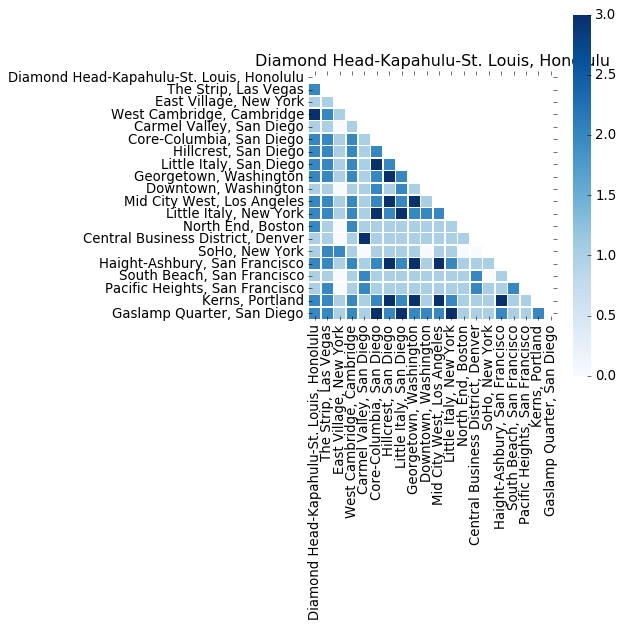

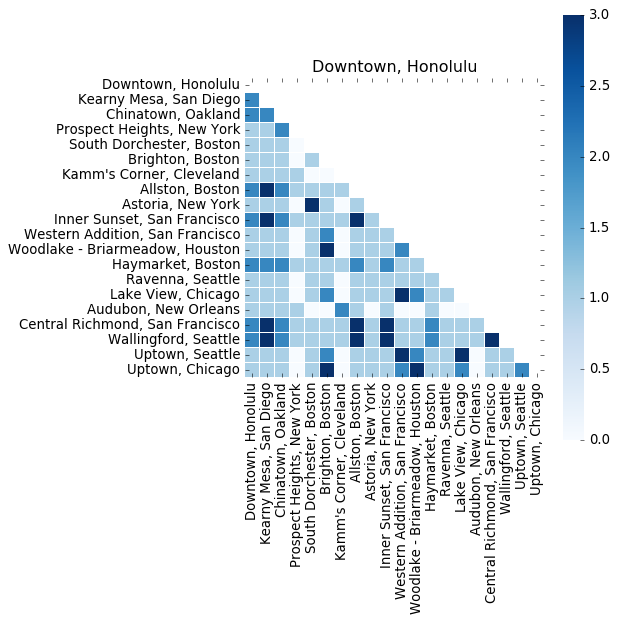

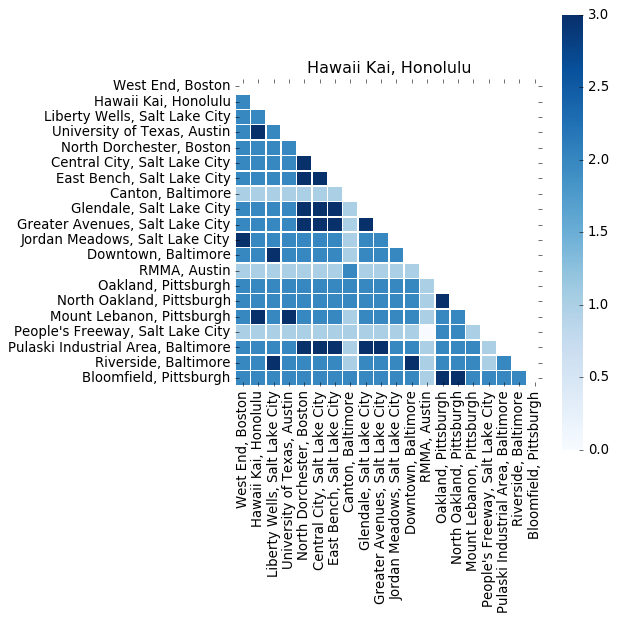

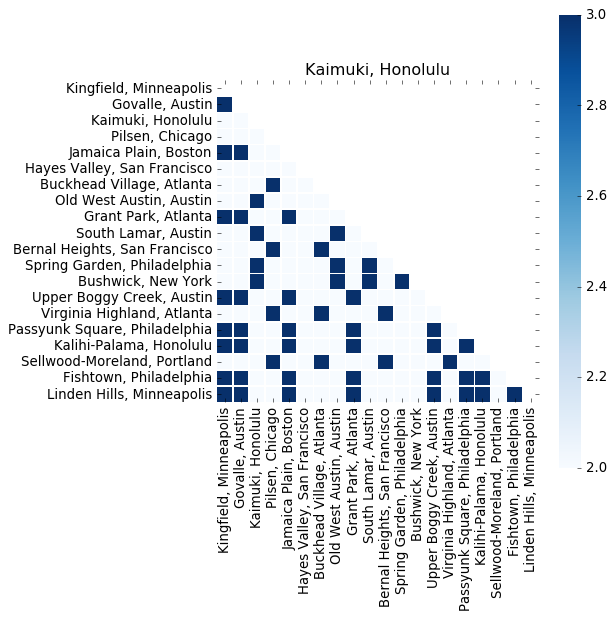

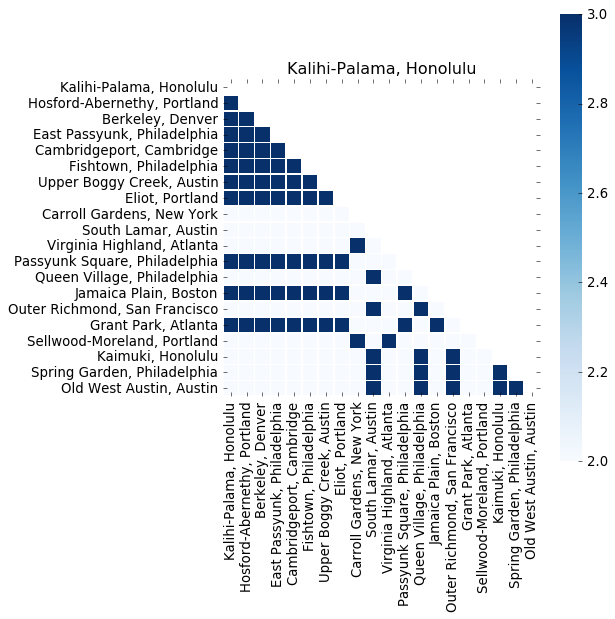

...

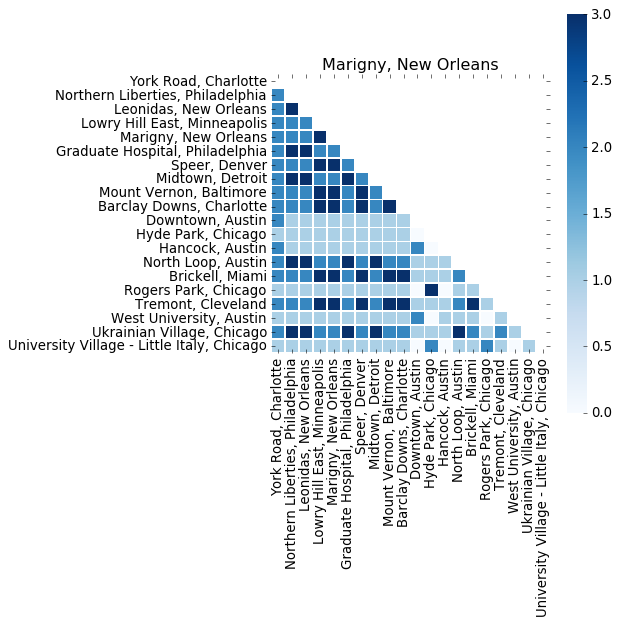

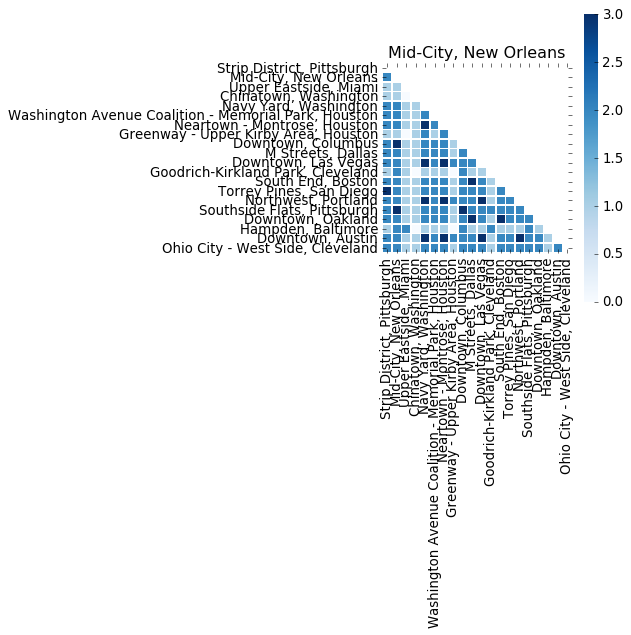

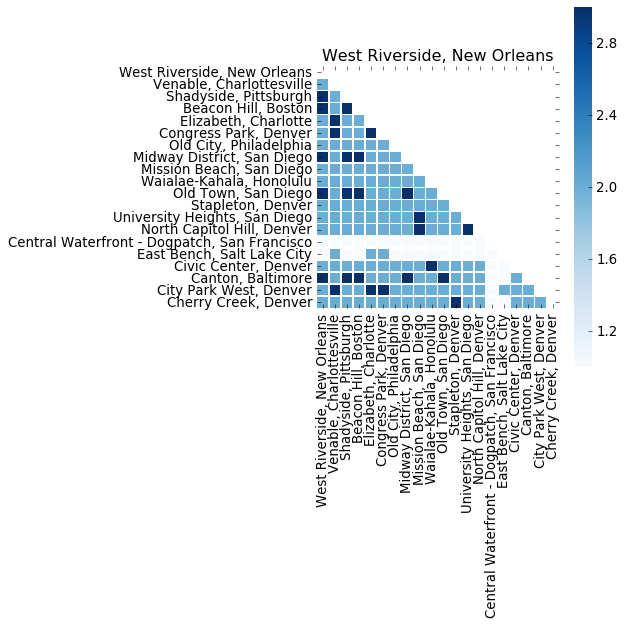

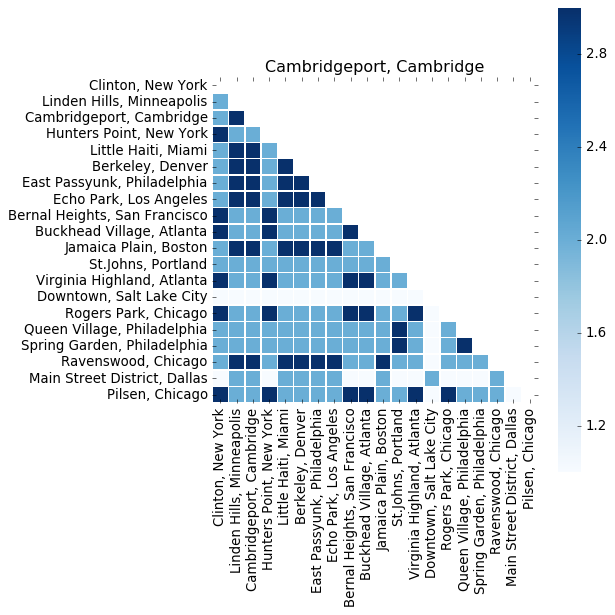

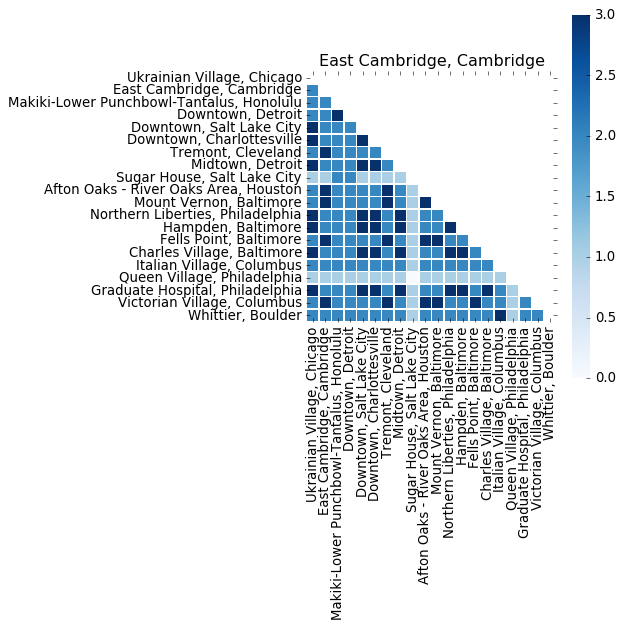

In [77]:
for neighb in k_means.index[150:200]:
    
    # Start with all neighborhoods
    test1 = k_means#.head(50)
    test2 = gmm#.head(50)
    test3 = neighb_colors#.head(50)
    
    # Find correlation between all neighborhoods
    a = [[int(i == j) for i in test1.labels] for j in test1.labels]
    b = [[int(i == j) for i in test2.labels] for j in test2.labels]
    c = [list(map(lambda a,b: a+b, a[i], b[i])) for i in range(len(a))]
    d = [[int(i == j) for i in test3.color] for j in test3.color]
    f = [list(map(lambda a,b: a+b, c[i], d[i])) for i in range(len(d))]

    temp = pd.DataFrame(data=f, index=test1.index, columns=test1.index)
    hood = neighb
    
    # Keep only those correlations with the current neighborhood
    hi = temp.loc[:,[hood]].sort_values(by=hood,ascending=False).head(20).index
#     hi = hi.loc[:,~hi.columns.duplicated()].sort_values(by=hood,ascending=False).head(20).index

    # Now grab columns corresponding to those found to have highest correlation with current neighborhood
    test1 = k_means.loc[hi]#.head(50)
    test2 = gmm.loc[hi]#.head(50)
    test3 = neighb_colors.loc[hi]#.head(50)

    # Find all correlations between neighborhoods with highest correlation with current neighborhood
    a = [[int(i == j) for i in test1.labels] for j in test1.labels]
    b = [[int(i == j) for i in test2.labels] for j in test2.labels]
    c = [list(map(lambda a,b: a+b, a[i], b[i])) for i in range(len(a))]
    d = [[int(i == j) for i in test3.color] for j in test3.color]
    f = [list(map(lambda a,b: a+b, c[i], d[i])) for i in range(len(d))]

    # Save these correlations in a dataframe
    temp = pd.DataFrame(data=f, index=test1.index, columns=test1.index) 

    # Plot the relationships of all neighborhoods most related to current neighborhood
    fig = plt.figure(figsize=(8,8))
    mask = np.zeros_like(temp, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True
    #cmap = sns.diverging_palette(220, 10, as_cmap=True)
    sns.heatmap(temp, cmap='Blues', linewidths=0.5, square=True, mask=mask, cbar=True)
    #plt.title('Correlation of Coffee Shop Neighborhood Metrics', size=14)
    plt.ylabel('')
    plt.xlabel('')
    plt.title(neighb)
    plt.tight_layout()
    #plt.savefig('plots/tots_wburg.png')
    plt.plot()

## Some titbits!!

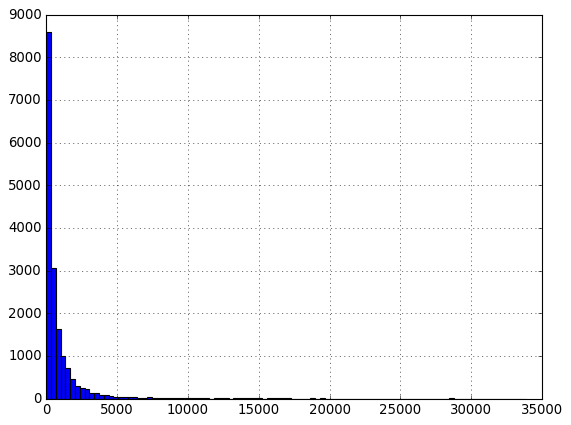

In [78]:
df_city[df_city['Utility_Score']>=0].Utility_Score.hist(bins=100)

In [79]:
def store_count(store_name=''):
    store_count = df_city.groupby(['City', 'Store_Name']).sum().sort_values(['City','Count'], ascending=[True,False])
    if store_name != '':
        store_count = store_count.filter(like=store_name,axis=0)
    store_count = store_count.reset_index(level=1, drop=True)
    store_count = store_count.groupby(store_count.index).sum()['Count']
    return store_count



/anaconda3/lib/python3.7/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


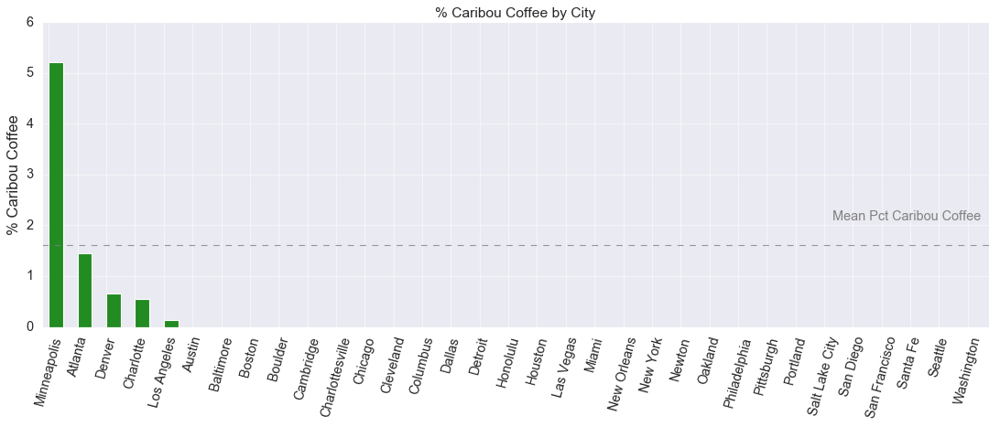

In [80]:
store_name = 'Caribou Coffee' # insert any coffee shop name in here

color = 'gray'
pct_starbucks = (store_count(store_name) / store_count()) * 100
pct_starbucks = pct_starbucks.sort_values(ascending=False)
plt.figure(figsize=(14,6))
ax = fig.add_subplot(111)
sns.set_style("darkgrid")
pct_starbucks.plot.bar(color='forestgreen', fontsize=13, rot=75, position=0.0)
plt.axhline(pct_starbucks.mean(), color=color, alpha=0.8,linestyle='--')
plt.text(27.3,pct_starbucks.mean()+0.5,'Mean Pct {}'.format(store_name), size=13, color=color)
plt.ylabel('% {}'.format(store_name), fontsize=15)
plt.xlabel('', fontsize=12)
plt.title('% {} by City'.format(store_name), size=14)
plt.tight_layout()
plt.savefig('plots/pct_starbucks.png')
plt.show()

In [81]:
city = 'Denver'
df_city_map.columns
df_city_map[(df_city_map.City == city) & ((df_city_map.Name =='Five Points') | (df_city_map.Name =="Central Business District"))]

,State,County,City,Name,RegionID,geometry,coords,count,mean_rating,pct_chain,mean_price,review_count,pct_strictly_coffee,pct_coffee_is_cat,pct_breakfast_and_brunch,pct_bakeries,pct_diner,pct_deli,pct_ice_cream_and_froyo,pct_juice_and_smoothie
974,CO,Denver,Denver,Central Business District,268632,POLYGON ((-104.9874700837624 39.74750922742454...,"(-104.99350443758058, 39.746285216604385)",57,3.702,0.228,1.509,142,0.298,0.544,0.298,0.088,0.0,0.0,0.018,0.018
978,CO,Denver,Denver,Five Points,268662,POLYGON ((-104.9719499999999 39.77024000000006...,"(-104.98733548871061, 39.759432134000065)",52,4.221,0.058,1.654,264,0.115,0.365,0.250,0.115,0.0,0.0,0.019,0.000


In [82]:
df_city.head()


,Store_Name,Categories,B_Id,Location,Zip_Code,Price,Rating,Review_Count,geometry,State,...,tea_and_juice,grab_and_go,fancy_donuts,third_wave,Count,tot_business_count_ZC,Avg_Income_ZC,pop_density,no_goog_hits,Utility_Score
0,Brash Coffee,['Coffee & Tea'],_0jwczJo5LaSo8e6liyS4Q,"(33.842003, -84.386072)",30305.0,2,4.5,25.0,POINT (-84.386072 33.842003),GA,...,False,False,False,False,1,2158,586201.833,3574.05,5,112.5
1,Astor Court,"['Breakfast & Brunch', 'Tea Rooms']",e9RQz4EG1ThimFpZpGaGiA,"(33.839928, -84.3825594)",30305.0,3,3.5,38.0,POINT (-84.38255940000001 33.839928),GA,...,False,False,False,False,1,2158,586201.833,3574.05,0,133.0
2,Souper Jenny,"['Sandwiches', 'Soup', 'Breakfast & Brunch']",mAW0poOKFdoaBFXAE-xjJA,"(33.8428047, -84.3864743)",30305.0,2,4.0,240.0,POINT (-84.3864743 33.8428047),GA,...,False,False,False,False,1,2158,586201.833,3574.05,0,960.0
3,Peachtree Road Farmers Market,['Farmers Market'],CCCFdTbkRWh8WAQK_x1T-A,"(33.831499, -84.38565)",30305.0,2,4.0,52.0,POINT (-84.38565 33.831499),GA,...,False,False,False,False,1,2158,586201.833,3574.05,0,208.0
4,Starbucks,['Coffee & Tea'],Ma_eP7RX1vWAhmjZTY7zyw,"(33.835393, -84.382662088102)",30305.0,1,3.0,33.0,POINT (-84.38266208810199 33.835393),GA,...,False,False,False,False,1,2158,586201.833,3574.05,4,99.0


(1.0, 5)

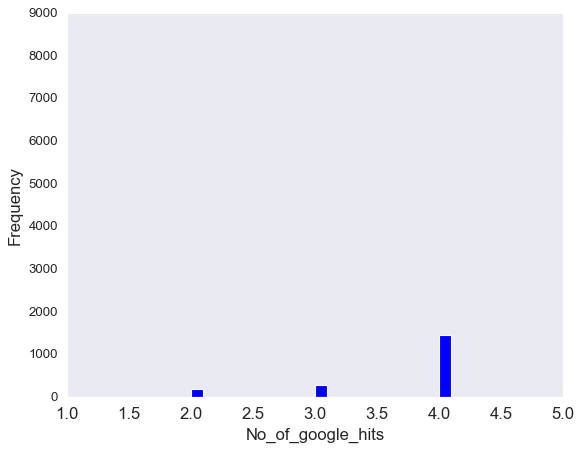

In [83]:
df_city['no_goog_hits'].hist(bins=100, grid=False, xlabelsize=15, ylabelsize=12)
plt.xlabel("No_of_google_hits", fontsize=15)
plt.ylabel("Frequency",fontsize=15)
plt.xlim([min(df_city['Utility_Score']),5])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a25113978>]],
      dtype=object)

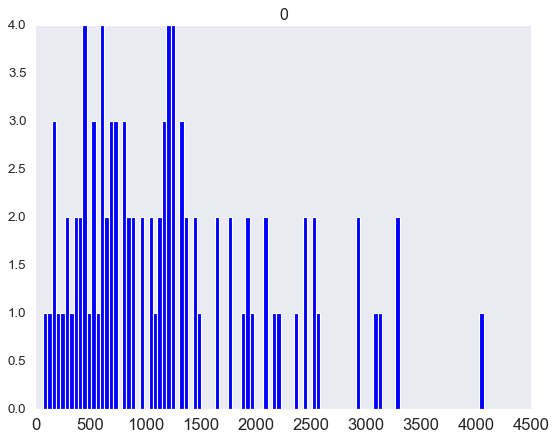

In [84]:
pd.DataFrame(Y_test).hist(bins=100,grid=False, xlabelsize=15, ylabelsize=12)

In [85]:
df_city.head(10)

,Store_Name,Categories,B_Id,Location,Zip_Code,Price,Rating,Review_Count,geometry,State,...,tea_and_juice,grab_and_go,fancy_donuts,third_wave,Count,tot_business_count_ZC,Avg_Income_ZC,pop_density,no_goog_hits,Utility_Score
0,Brash Coffee,['Coffee & Tea'],_0jwczJo5LaSo8e6liyS4Q,"(33.842003, -84.386072)",30305.0,2,4.5,25.0,POINT (-84.386072 33.842003),GA,...,False,False,False,False,1,2158,586201.833,3574.05,5,112.5
1,Astor Court,"['Breakfast & Brunch', 'Tea Rooms']",e9RQz4EG1ThimFpZpGaGiA,"(33.839928, -84.3825594)",30305.0,3,3.5,38.0,POINT (-84.38255940000001 33.839928),GA,...,False,False,False,False,1,2158,586201.833,3574.05,0,133.0
2,Souper Jenny,"['Sandwiches', 'Soup', 'Breakfast & Brunch']",mAW0poOKFdoaBFXAE-xjJA,"(33.8428047, -84.3864743)",30305.0,2,4.0,240.0,POINT (-84.3864743 33.8428047),GA,...,False,False,False,False,1,2158,586201.833,3574.05,0,960.0
3,Peachtree Road Farmers Market,['Farmers Market'],CCCFdTbkRWh8WAQK_x1T-A,"(33.831499, -84.38565)",30305.0,2,4.0,52.0,POINT (-84.38565 33.831499),GA,...,False,False,False,False,1,2158,586201.833,3574.05,0,208.0
4,Starbucks,['Coffee & Tea'],Ma_eP7RX1vWAhmjZTY7zyw,"(33.835393, -84.382662088102)",30305.0,1,3.0,33.0,POINT (-84.38266208810199 33.835393),GA,...,False,False,False,False,1,2158,586201.833,3574.05,4,99.0
5,Swan Coach House,"['American (New)', 'Tea Rooms', 'Venues & Even...",mWuwXurRgM28l7QzALoVmA,"(33.8405902, -84.3854981)",30305.0,2,4.0,76.0,POINT (-84.38549810000001 33.8405902),GA,...,False,False,False,False,1,2158,586201.833,3574.05,0,304.0
6,Ébrìk Coffee Room,"['Coffee & Tea', 'Bakeries']",FVHhIm3Qgtj1xlOUuD5yXA,"(33.7552477504863, -84.3881651478313)",30303.0,1,4.5,298.0,POINT (-84.3881651478313 33.7552477504863),GA,...,False,False,False,False,1,1591,16803.000,5678.47,4,1341.0
7,Cafe Lucia,"['Coffee & Tea', 'Bagels', 'Juice Bars & Smoot...",yx91SEYTHsuHGQoKV-189g,"(33.755774, -84.389916)",30303.0,1,4.5,92.0,POINT (-84.389916 33.755774),GA,...,False,False,False,False,1,1591,16803.000,5678.47,5,414.0
8,Panbury's Pie Café,"['British', 'Coffee & Tea', 'Bakeries']",a1VvFt4iDaVlj-8Vk1uyPA,"(33.7602246, -84.3871759)",30303.0,1,4.5,89.0,POINT (-84.3871759 33.7602246),GA,...,False,False,False,False,1,1591,16803.000,5678.47,5,400.5
9,Condesa Coffee,"['Coffee & Tea', 'Breakfast & Brunch']",bHKXsMG9Z4jQf746cV059g,"(33.7553100585938, -84.3828201293945)",30303.0,1,4.0,44.0,POINT (-84.3828201293945 33.7553100585938),GA,...,False,False,False,False,1,1591,16803.000,5678.47,5,176.0


In [86]:

def categorize(item):
    if item.corporate:
        return 'corporate'
    if item.tea_and_juice:
        return 'tea_and_juice'
    if item.grab_and_go:
        return 'grab_and_go'
    if item.third_wave:
        return 'third_wave'
    else:
        return 'independent'

df_city['category'] = [categorize(df_city.iloc[i]) for i in range(len(df_city))] 
#mega_data.head()



In [87]:
city_map  = gdf_city_map[(gdf_city_map.City == city) & ((gdf_city_map.Name =='Five Points') | (gdf_city_map.Name =="Central Business District"))]
city_data = df_city[(df_city.City == city) & ((df_city.Name =='Five Points') | (df_city.Name =="Central Business District"))]

a = city_data.Location.apply(lambda x: x.split(', '))
x = a.apply(lambda x: float(x[0][1:]))
y = a.apply(lambda x: float(x[1][:-1]))
city_data['x'] = x
city_data['y'] = y




def plot_map(map_gdf, data_gdf, column='count', neighborhood_labels=True):
    sns.set_style("white")
    vmin, vmax = map_gdf[column].min(), map_gdf[column].max()
    fig, ax = plt.subplots(1, figsize=(8,8))
    base = map_gdf.plot(ax=ax, edgecolor='black', vmin=vmin, vmax=vmax, legend=True, color='lightsteelblue', alpha=0.5)
    
    data_gdf.set_index('y').sort_index().groupby('category')['x'].plot(style='o', legend=True, markersize=8, alpha=0.6,)

    #data_gdf.plot(ax=base, marker="o", label=data_gdf.category, cmap='viridis', markersize=14, alpha=0.7)
    # add neighborhood labels
    if neighborhood_labels == True:
        for idx, row in map_gdf.iterrows():
            if row['Name'] == 'Five Points':
                vert, hor, rot = 'top', 'left', '20'
            else:
                vert, hor, rot = 'center', 'center', '20'
              
            xy=row['coords']
            s=row['Name']
            print(s,xy)
#             ax.annotate(s=row['Name'], xy=row['coords'], color='k', ha=hor, 
#                          va=vert , family='sans-serif', size=11, rotation=rot)
    ax.set_title("Bordering Denver Neighborhoods", size=16)
    ax.legend(loc=2, fontsize=13)
    plt.xlabel('')
    plt.yticks([])
    plt.xticks([])
    plt.tight_layout()
    plt.savefig('plots/denver_neighborhood_comp.png')
    
    plt.show()

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [88]:
from bokeh.plotting import figure,save
from bokeh.models import ColumnDataSource, HoverTool, CategoricalColorMapper, ColorBar, GeoJSONDataSource, LogTicker,Legend
from bokeh.transform import factor_cmap
from bokeh.palettes import Spectral6
from bokeh.io import show, output_notebook
from geopandas import GeoDataFrame

city_map  = gdf_city_map[(gdf_city_map.City == city) & ((gdf_city_map.Name =='Five Points') | (gdf_city_map.Name =="Central Business District"))]
city_data = df_city[(df_city.City == city) & ((df_city.Name =='Five Points') | (df_city.Name =="Central Business District"))]

a = city_data.Location.apply(lambda x: x.split(', '))
x = a.apply(lambda x: float(x[0][1:]))
y = a.apply(lambda x: float(x[1][:-1]))
city_data['x'] = x
city_data['y'] = y
geometry=[Point(xy) for xy in zip(city_data.x, city_data.y)]
crs = city_map.crs
city_data = GeoDataFrame(city_data, crs=crs, geometry=geometry)
label=city_data.category.tolist()
label_unique=list(set(label))
print(label_unique)
# Convert GeoDataFrames into GeoJSONDataSource objects (similar to ColumnDataSource)
point_source = GeoJSONDataSource(geojson=city_data.to_json())
map_source = GeoJSONDataSource(geojson=city_map.to_json())
p = figure(title="Bordering Denver Neighborhoods")
# Add the lines to the map from our GeoJSONDataSource -object (it is important to specify the columns as 'xs' and 'ys')
p.patches('xs', 'ys', source=map_source, color='gray', line_width=3,line_color = "white")
# Create color map which will be used for displaying utility scores as unique colors
color_mapper = CategoricalColorMapper(factors=label_unique,palette=Spectral6)

# Add the lines to the map from our 'msource' ColumnDataSource -object
p.circle('y', 'x', source=point_source, size=8, color={'field': 'category',
                                                     'transform': color_mapper},name="foo")
for factor,color in zip(color_mapper.factors,color_mapper.palette):
    p.circle(x=[],y=[],fill_color=color,legend=factor)
    p.legend.location = 'top_left'
# for factor, color in zip(color_mapper.factors, color_mapper.palette):
#     p.circle(x=[], y=[], fill_color=color, legend=factor)


#p.circle('y', 'x', source=point_source, size=4,name="foo",legend='label_unique')
# # Add color bar
# # color_bar = ColorBar(color_mapper=color_mapper, width=8,  location=(0,0))
# # p.add_layout(color_bar, 'right')

# # Implement interactivity
my_hover = HoverTool(names=["foo"])
my_hover.tooltips = [('Neighborhood Name','@Name'),('Neighborhood Category', '@category')]
p.add_tools(my_hover)
output_notebook()  
show(p)

# # Save the map
# save(p, outfp)

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


['independent', 'grab_and_go', 'tea_and_juice', 'corporate', 'third_wave']


Loading BokehJS ...

In [89]:
city_data.columns

Index(['Store_Name', 'Categories', 'B_Id', 'Location', 'Zip_Code', 'Price',
       'Rating', 'Review_Count', 'geometry', 'State', 'County', 'City', 'Name',
       'RegionID', 'chain', 'strictly_coffee', 'coffee_is_cat',
       'breakfast_and_brunch', 'bakeries', 'diner', 'deli',
       'ice_cream_and_froyo', 'juice_and_smoothie', 'primary_category',
       'geom_mean_tt_shop', 'rat_cat-NLTK_adjst', 'questionable', 'corporate',
       'tea_and_juice', 'grab_and_go', 'fancy_donuts', 'third_wave', 'Count',
       'tot_business_count_ZC', 'Avg_Income_ZC', 'pop_density', 'no_goog_hits',
       'Utility_Score', 'category', 'x', 'y'],
      dtype='object')

Central Business District (-104.99350443758058, 39.746285216604385)
Five Points (-104.98733548871061, 39.759432134000065)


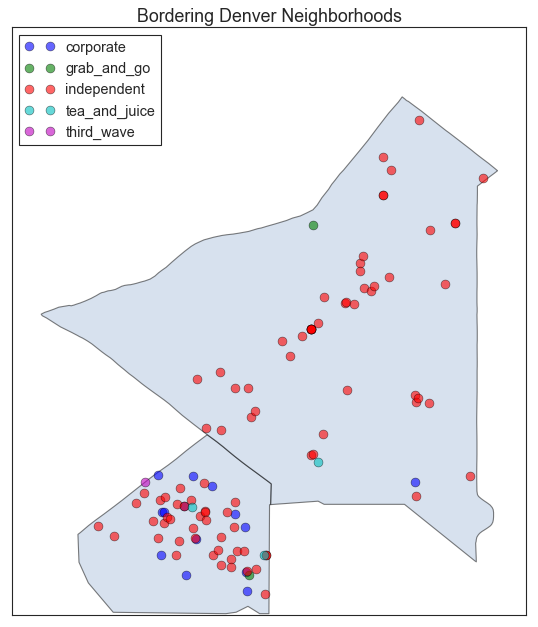

In [90]:
plot_map(city_map, city_data, 'count')

In [91]:
df_new.shape
data_neighb_low=df_new[df_new['Count']<10]
#data_temp=df_new.copy(deep=True)

print(data_neighb_low.shape)
Y=np.asarray(data_neighb_low['Avg_Utility_Score'])
X=np.asarray(data_neighb_low.loc[:,~data_neighb_low.columns.isin(['loc_City','Avg_Utility_Score','Count'])])
print(X.shape,Y.shape)

(1446, 18)
(1446, 15) (1446,)


In [92]:
data_neighb_low.head()
columns=[col for col in data_neighb_low.columns if col not in ['Avg_Utility_Score', 'Count','loc_City']]
from sklearn.preprocessing import Imputer
imputer = Imputer(missing_values = 'NaN', strategy = 'median', axis = 0)
imputer = imputer.fit(X)
X = imputer.transform(X)
scaler = preprocessing.MinMaxScaler()
minmax_scaled_df = scaler.fit_transform(X)

minmax_scaled_df = pd.DataFrame(minmax_scaled_df, 
                                columns=columns,index=data_neighb_low.index) 
print(pd.DataFrame(data_neighb_low['loc_City'],index=data_neighb_low.index).shape)

minmax_scaled_df=pd.concat([minmax_scaled_df,pd.DataFrame(data_neighb_low['loc_City'],index=data_neighb_low.index)],axis=1)
minmax_scaled_df['loc_id'] = minmax_scaled_df.index + ', ' + minmax_scaled_df.loc_City
minmax_scaled_df.drop(columns=['loc_City'],inplace=True)
minmax_scaled_df.set_index('loc_id',drop=True,inplace=True)

minmax_scaled_df.head()

(1446, 1)


/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:58: DeprecationWarning: Class Imputer is deprecated; Imputer was deprecated in version 0.20 and will be removed in 0.22. Import impute.SimpleImputer from sklearn instead.
  warnings.warn(msg, category=DeprecationWarning)


,coffee_shop_density,business_density,mean_price,mean_goog_search,Avg_income_neighborhood,geom_mean_tt,rating_stdev,review_stdev,pct_fancy_donuts,pct_bakeries,pct_corporate,pct_tea_and_juice,pct_grab_and_go,pct_third_wave,pct_independent
loc_id,,,,,,,,,,,,,,,
"Acorn, Oakland",0.052386,0.061306,0.000000,0.250000,0.078033,0.400421,0.714286,0.026610,0.5,0.0,0.0,0.0,0.5,0.0,0.5
"Acorn Industrial, Oakland",0.055085,0.064456,0.250000,0.916667,0.078033,0.400421,0.142857,0.014369,0.0,0.0,0.0,0.0,0.0,0.0,1.0
"Adams Point, Oakland",0.150582,0.084954,0.277778,0.462963,0.207147,0.400421,0.315869,0.245610,0.0,0.0,0.0,0.0,0.0,0.0,1.0
"Allendale, Oakland",0.035123,0.008776,0.000000,0.000000,0.104983,0.400421,0.142857,0.422033,0.5,0.0,0.0,0.0,0.0,0.0,1.0
"Arrowhead Marsh, Oakland",0.005632,0.003765,0.250000,0.333333,0.045065,0.400421,0.428571,0.062799,0.0,0.0,0.5,0.0,0.0,0.0,0.5


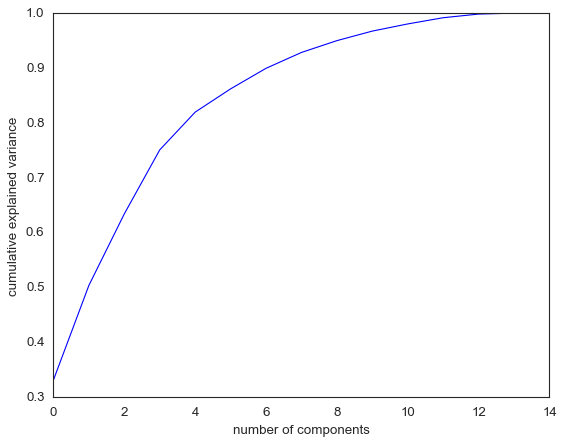

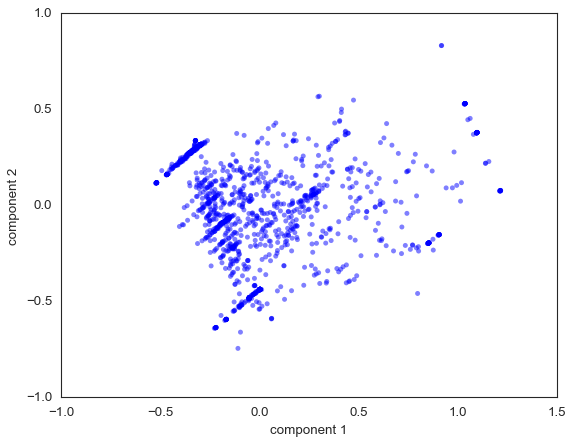

In [93]:
pca = PCA().fit(minmax_scaled_df.values)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.show()

pca = PCA(5)
projected = pca.fit_transform(minmax_scaled_df.values)
plt.scatter(projected[:, 0], projected[:, 1], edgecolor='none', alpha=0.5)
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.show()

In [94]:
predictions_neighbs_low=list(model.predict(projected))


In [95]:
#print(predictions_neighbs_low)

In [96]:
data_neighb_low['Predicted_Utility_Score']=predictions_neighbs_low

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [97]:
data_neighb_low.head(30)

,loc_City,coffee_shop_density,business_density,mean_price,mean_goog_search,Avg_income_neighborhood,geom_mean_tt,rating_stdev,review_stdev,pct_fancy_donuts,pct_bakeries,pct_corporate,pct_tea_and_juice,pct_grab_and_go,pct_third_wave,pct_independent,Avg_Utility_Score,Count,Predicted_Utility_Score
loc_neighborhood,,,,,,,,,,,,,,,,,,,
Acorn,Oakland,4.45295,6389.98,1.000000,1.500000,139153.333000,975.06,1.767767,35.355339,0.50,0.000000,0.000000,0.000000,0.500000,0.0,0.500000,92.316500,2,855.309277
Acorn Industrial,Oakland,4.68175,6718.32,1.500000,5.500000,139153.333000,975.06,0.353553,19.091883,0.00,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,356.741500,2,955.688015
Adams Point,Oakland,12.7776,8854.88,1.555556,2.777778,369398.500000,975.06,0.781736,326.330780,0.00,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,1488.490667,9,1472.443924
Allendale,Oakland,2.98946,914.774,1.000000,0.000000,187212.833000,975.06,0.353553,560.735677,0.50,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,2505.875000,2,1421.385653
Arrowhead Marsh,Oakland,0.489354,392.462,1.500000,2.000000,80363.000000,975.06,1.060660,83.438600,0.00,0.000000,0.500000,0.000000,0.000000,0.0,0.500000,220.400000,2,-64.316550
Bushrod,Oakland,4.00145,2949.07,1.000000,3.000000,150079.500000,975.06,0.418330,88.962352,0.00,0.200000,0.000000,0.000000,0.000000,0.0,1.000000,1053.036600,5,1042.556518
Castlemont,Oakland,1.59779,556.031,1.000000,0.000000,232184.667000,975.06,NaN,NaN,0.00,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,140.167000,1,1562.840883
Civic Center,Oakland,23.4679,31695.1,1.428571,1.142857,192538.357000,975.06,0.994030,53.278245,0.00,0.142857,0.000000,0.000000,0.142857,0.0,0.857143,371.533429,7,1560.028031
Clawson,Oakland,1.63124,1937.91,2.000000,4.500000,214694.500000,975.06,1.060660,45.961941,0.00,0.500000,0.500000,0.000000,0.000000,0.0,0.500000,197.925000,2,-258.227399


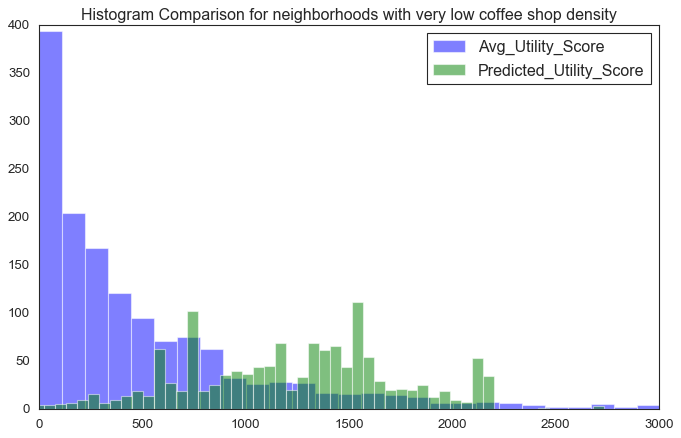

In [98]:
fig,ax=plt.subplots(1,1,figsize=(10,6))

ax.hist(data_neighb_low['Avg_Utility_Score'], bins=100, alpha=0.5)
ax.hist(data_neighb_low['Predicted_Utility_Score'], bins=100, alpha=0.5)
ax.set_title('Histogram Comparison for neighborhoods with very low coffee shop density')
ax.set_xlim([0,3000])
ax.legend(loc='upper right')


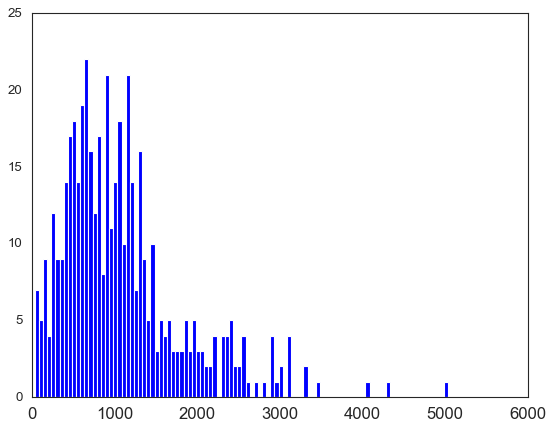

In [99]:
data_temp.head()
data_temp['Avg_Utility_Score'].hist(bins=100, grid=False, xlabelsize=15, ylabelsize=12)